# Spatial Transcriptomics Analysis

## Visium HD

In [ ]:
from stLENS import stLENS
stlens = stLENS()

/home/khyeonmin/micromamba/envs/stLENS/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Load data

In [ ]:
!wget -P ./data/visiumhd https://cf.10xgenomics.com/samples/spatial-exp/3.0.0/Visium_HD_Human_Colon_Cancer_P1/Visium_HD_Human_Colon_Cancer_P1_binned_outputs.tar.gz
!wget -P ./data/visiumhd https://cf.10xgenomics.com/samples/spatial-exp/3.0.0/Visium_HD_Human_Colon_Cancer_P1/Visium_HD_Human_Colon_Cancer_P1_feature_slice.h5
!tar -xvzf ./data/visiumhd/Visium_HD_Human_Colon_Cancer_P1_binned_outputs.tar.gz -C ./data/visiumhd
!wget -P ./data/visiumhd https://zenodo.org/records/15042463/files/HumanColonCancer_VisiumHD-main.zip
!unzip ./data/visiumhd/HumanColonCancer_VisiumHD-main.zip -d ./data/visiumhd

In [3]:
import spatialdata as sd
import spatialdata_io

sdata = spatialdata_io.visium_hd(path='./data/visiumhd', load_all_images=False)
sdata

/home/l202255179/micromamba/envs/kogo3/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/l202255179/micromamba/envs/kogo3/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/l202255179/micromamba/envs/kogo3/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_1894890/3816237370.py:4: UserWarning: No full resolution image found. If incorrect, please specify the path in the `fullres_image_file` parameter when calling the `visium_hd` reader function.
  sdata = spatialdata_io.visium_hd(path='./data/visiumhd', load_all_images=False)


SpatialData object
├── Images
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_hires_image': DataArray[cyx] (3, 4961, 6000)
│     └── 'Visium_HD_Human_Colon_Cancer_P1_lowres_image': DataArray[cyx] (3, 496, 600)
├── Shapes
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_002um': GeoDataFrame shape: (8115564, 1) (2D shapes)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_008um': GeoDataFrame shape: (507684, 1) (2D shapes)
│     └── 'Visium_HD_Human_Colon_Cancer_P1_square_016um': GeoDataFrame shape: (127809, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (8115564, 18085)
      ├── 'square_008um': AnnData (507684, 18085)
      └── 'square_016um': AnnData (127809, 18085)
with coordinate systems:
    ▸ 'downscaled_hires', with elements:
        Visium_HD_Human_Colon_Cancer_P1_hires_image (Images), Visium_HD_Human_Colon_Cancer_P1_square_002um (Shapes), Visium_HD_Human_Colon_Cancer_P1_square_008um (Shapes), Visium_HD_Human_Colon_Cancer_P1_square_016um (Shapes)
    ▸ 'downscaled_lowre

In [5]:
import pandas as pd
dr = pd.read_csv('./data/visiumhd/HumanColonCancer_VisiumHD-main/MetaData/DeconvolutionResults_P1CRC.csv.gz')
dr

/tmp/ipykernel_443437/3168614296.py:2: DtypeWarning: Columns (1,2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  dr = pd.read_csv('./data/visiumhd/HumanColonCancer_VisiumHD-main/MetaData/DeconvolutionResults_P1CRC.csv.gz')


,barcode,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2
0,s_008um_00000_00000-1,NaN,NaN,NaN
1,s_008um_00000_00001-1,NaN,NaN,NaN
2,s_008um_00000_00002-1,NaN,NaN,NaN
3,s_008um_00000_00003-1,NaN,NaN,NaN
4,s_008um_00000_00004-1,NaN,NaN,NaN
...,...,...,...,...
702239,s_008um_00837_00833-1,NaN,NaN,NaN
702240,s_008um_00837_00834-1,NaN,NaN,NaN
702241,s_008um_00837_00835-1,NaN,NaN,NaN
702242,s_008um_00837_00836-1,NaN,NaN,NaN


In [6]:
filtered_dr = dr.dropna(subset=["DeconvolutionLabel1", "DeconvolutionLabel2"], how="all")
filtered_dr

,barcode,DeconvolutionClass,DeconvolutionLabel1,DeconvolutionLabel2
289,s_008um_00000_00289-1,singlet,Tumor II,Mast
290,s_008um_00000_00290-1,singlet,Tumor II,Endothelial
291,s_008um_00000_00291-1,singlet,Tumor II,Proliferating Fibroblast
292,s_008um_00000_00292-1,singlet,Tumor II,Adipocyte
293,s_008um_00000_00293-1,singlet,Tumor II,Tumor V
...,...,...,...,...
652681,s_008um_00778_00717-1,singlet,vSM,Endothelial
652773,s_008um_00778_00809-1,singlet,vSM,Fibroblast
652774,s_008um_00778_00810-1,singlet,vSM,Smooth Muscle
653519,s_008um_00779_00717-1,singlet,vSM,cDC I


In [7]:
mask = sdata.tables['square_008um'].obs.index.isin(filtered_dr['barcode'].values)
adata = sdata.tables['square_008um'][mask]

filtered_dr_indexed = filtered_dr.set_index('barcode')

adata.obs = adata.obs.merge(
    filtered_dr_indexed[['DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2']],
    left_index=True, right_index=True, how='left'
)
adata

/home/l202255179/micromamba/envs/kogo3/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 311355 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [ ]:
adata.write_h5ad('./data/visiumhd/anndata_human_crc.h5ad')

/tmp/ipykernel_1049199/3159902038.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='DeconvolutionLabel1', spot_size=100)


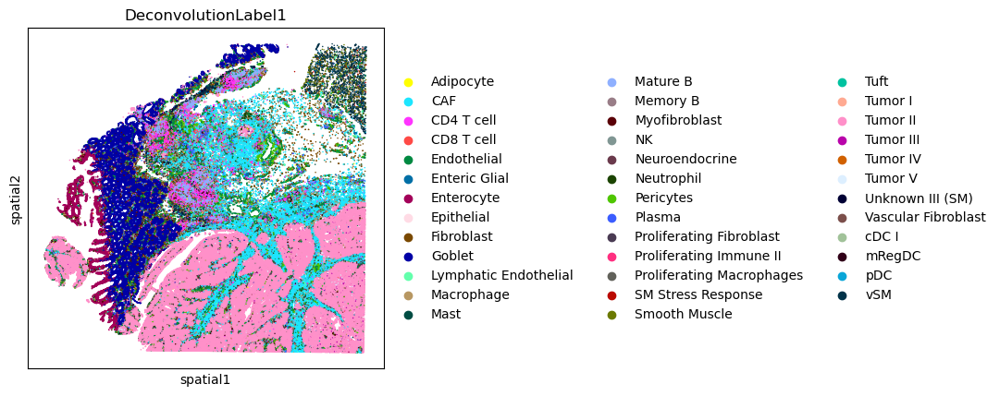

In [10]:
sc.pl.spatial(adata, color='DeconvolutionLabel1', spot_size=100)

### Quality Control

Filtering with Scanpy (conventional method):

In [ ]:
import scanpy as sc

adata.layers["counts"] = adata.X.copy()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=15)
adata

/home/khyeonmin/micromamba/envs/stLENS/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/khyeonmin/micromamba/envs/stLENS/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 159526 × 16798
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'
    layers: 'counts'

### Normalization & PCA

In [4]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

sparsity_th: 0.03196463387862744
Initial sparse: 0.999, threshold: 0.9
Min(corr): 0.03662698343396187, sparsity: 0.999
Min(corr): 0.033655326813459396, sparsity: 0.998
Min(corr): 0.031607866287231445, sparsity: 0.997
Min(corr): 0.029859153553843498, sparsity: 0.996
Min(corr): 0.029562808573246002, sparsity: 0.995
Min(corr): 0.029139960184693336, sparsity: 0.994
Min(corr): 0.02909201942384243, sparsity: 0.993
Sparsity calculation completed: 0.997
Max interactions exceeded!
lambda_c: 16.88406
Number of signal: 102


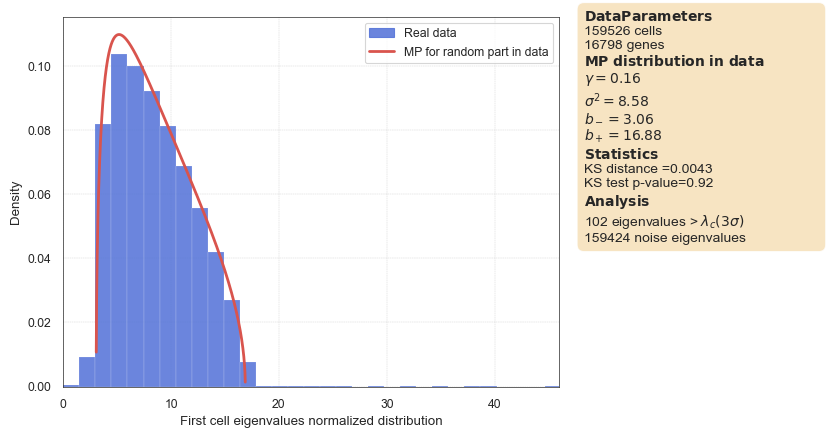

100%|██████████| 20/20 [16:11<00:00, 48.57s/it]


number of filtered signals: 41


41

In [ ]:
stlens.find_optimal_pc(adata, plot_mp = True, device='gpu', tmp_directory='./output/visiumhd_last')

In [6]:
stlens_adata = stlens.pca(adata, inplace=False)
stlens_adata

/home/khyeonmin/micromamba/envs/stLENS/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 159526 × 16798
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatialdata_attrs', 'stlens'
    obsm: 'spatial', 'X_pca_stlens'
    layers: 'counts'

In [ ]:
adata2 = sc.read_h5ad('./data/visiumhd/anndata_human_crc.h5ad')

In [ ]:
import scanpy as sc

adata.layers["counts"] = adata.X.copy()
sc.pp.filter_cells(adata2, min_genes=200)
sc.pp.filter_genes(adata2, min_cells=15)

/home/khyeonmin/micromamba/envs/stLENS/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/khyeonmin/micromamba/envs/stLENS/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [8]:
sc.pp.normalize_total(adata2)
sc.pp.log1p(adata2)

scanpy_adata = sc.pp.pca(adata2, copy=True)
scanpy_adata

AnnData object with n_obs × n_vars = 159526 × 16798
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatialdata_attrs', 'log1p', 'pca'
    obsm: 'spatial', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

### KNN & UMAP embedding & Leiden Clustering

In [9]:
# KNN
sc.pp.neighbors(stlens_adata, use_rep='X_pca_stlens', metric='cosine')
sc.pp.neighbors(scanpy_adata, use_rep='X_pca')

# UMAP embedding
sc.tl.umap(stlens_adata)
sc.tl.umap(scanpy_adata)

In [10]:
stlens_adata, scanpy_adata

(AnnData object with n_obs × n_vars = 159526 × 16798
     obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'n_genes'
     var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
     uns: 'spatialdata_attrs', 'stlens', 'neighbors', 'umap'
     obsm: 'spatial', 'X_pca_stlens', 'X_umap'
     layers: 'counts'
     obsp: 'distances', 'connectivities',
 AnnData object with n_obs × n_vars = 159526 × 16798
     obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'n_genes'
     var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
     uns: 'spatialdata_attrs', 'log1p', 'pca', 'neighbors', 'umap'
     obsm: 'spatial', 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'counts'
     obsp: 'distances', 'connectivities')

In [11]:
# Leiden Clustering across resolutions

def leiden_loop(adata):
    res_range=np.arange(0.5, 5.1, 0.5)

    for res in res_range:
        leiden_key = f"leiden_{res:.1f}"
        if leiden_key not in adata.obs:
            sc.tl.leiden(adata, resolution=res, key_added=leiden_key)

leiden_loop(stlens_adata)
leiden_loop(scanpy_adata)
stlens_adata, scanpy_adata

/tmp/ipykernel_2336373/3009197428.py:9: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=res, key_added=leiden_key)


(AnnData object with n_obs × n_vars = 159526 × 16798
     obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'n_genes', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0'
     var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
     uns: 'spatialdata_attrs', 'stlens', 'neighbors', 'umap', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0'
     obsm: 'spatial', 'X_pca_stlens', 'X_umap'
     layers: 'counts'
     obsp: 'distances', 'connectivities',
 AnnData object with n_obs × n_vars = 159526 × 16798
     obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'n_genes', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_

In [ ]:
stlens_adata.write_h5ad('./output/visiumhd/stlens_adata')
scanpy_adata.write_h5ad('./output/visiumhd/scanpy_adata')

### Figure

In [12]:
import matplotlib as mpl

mpl.rcParams['font.family'] = 'Arial'

In [14]:
# Excluded cells annotated as 'unknown' and applied label shortening

mask = stlens_adata.obs['DeconvolutionLabel1'] != 'Unknown III (SM)'
stlens_adata = stlens_adata[mask].copy()

mask = scanpy_adata.obs['DeconvolutionLabel1'] != 'Unknown III (SM)'
scanpy_adata = scanpy_adata[mask].copy()

name_map = {
    'Goblet': 'Goblet',
    'Tumor II': 'Tumor2',
    'CD4 T cell': 'CD4 T',
    'CAF': 'CAF',
    'Macrophage': 'Macro',
    'Proliferating Fibroblast': 'ProFib',
    'Tumor III': 'Tumor3',
    'Mature B': 'B Mature',
    'Pericytes': 'Pericyte',
    'Myofibroblast': 'MyoFib',
    'Endothelial': 'Endo',
    'CD8 T cell': 'CD8 T',
    'Tuft': 'Tuft',
    'Proliferating Macrophages': 'ProMacro',
    'Enterocyte': 'Entero',
    'Fibroblast': 'Fibro',
    'cDC I': 'cDC1',
    'mRegDC': 'mRegDC',
    'Plasma': 'Plasma',
    'Enteric Glial': 'Glial',
    'Tumor V': 'Tumor5',
    'Proliferating Immune II': 'ProImmune2',
    'Neutrophil': 'Neutro',
    'Tumor IV': 'Tumor4',
    'Neuroendocrine': 'Neuroendo',
    'Lymphatic Endothelial': 'LymphEndo',
    'Mast': 'Mast',
    'pDC': 'pDC',
    'Tumor I': 'Tumor1',
    'Epithelial': 'Epi',
    'vSM': 'vSM',
    'Smooth Muscle': 'SM',
    'Memory B': 'B Memory',
    'Adipocyte': 'Adipo',
    'SM Stress Response': 'SM_Stress',
    'NK': 'NK'
    }

stlens_adata.obs['Faria de Oliveira et al.'] = stlens_adata.obs['DeconvolutionLabel1'].replace(name_map)
scanpy_adata.obs['Faria de Oliveira et al.'] = scanpy_adata.obs['DeconvolutionLabel1'].replace(name_map)
stlens_adata, scanpy_adata

/home/khyeonmin/micromamba/envs/stLENS/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_2336373/3513667027.py:48: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  stlens_adata.obs['Faria de Oliveira et al.'] = stlens_adata.obs['DeconvolutionLabel1'].replace(name_map)
/tmp/ipykernel_2336373/3513667027.py:49: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  scanpy_adata.obs['Faria de Oliveira et al.'] = scanpy_adata

(AnnData object with n_obs × n_vars = 159488 × 16798
     obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'n_genes', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0', 'Faria de Oliveira et al.'
     var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
     uns: 'spatialdata_attrs', 'stlens', 'neighbors', 'umap', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0'
     obsm: 'spatial', 'X_pca_stlens', 'X_umap'
     layers: 'counts'
     obsp: 'distances', 'connectivities',
 AnnData object with n_obs × n_vars = 159488 × 16798
     obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'DeconvolutionClass', 'DeconvolutionLabel1', 'DeconvolutionLabel2', 'n_genes', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_

#### Ground Truth based measures

/tmp/ipykernel_2336373/2182825613.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  src = label_codes[i]
/tmp/ipykernel_2336373/2182825613.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  neighbor_labels = label_codes[neighbors]
/tmp/ipykernel_2336373/2182825613.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  src = label_codes[i]
/tmp/ipykernel_2336373/2182825613.py:26: FutureWarning: Series.__getitem__ treating keys as 

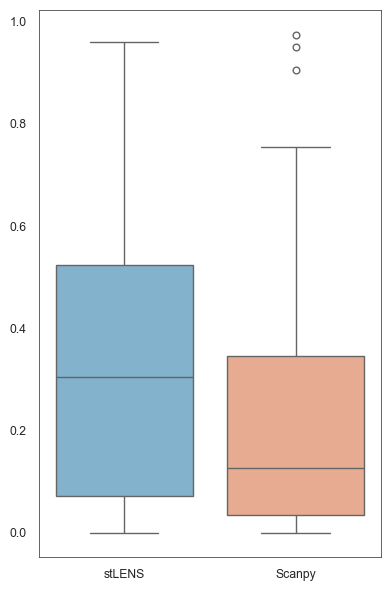

In [15]:
import seaborn as sns
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
from collections import defaultdict

def neighbor_confusion_matrix(adata, label_key='cell_name', k=15):
    conn = adata.obsp['connectivities'].tolil()
    labels = adata.obs[label_key].astype('category')
    label_codes = labels.cat.codes
    label_names = labels.cat.categories
    n_labels = len(label_names)

    mat = np.zeros((n_labels, n_labels))  

    for i in range(adata.n_obs):
        src = label_codes[i] 
        neighbors = conn.rows[i] 
        neighbors = [j for j in neighbors if j != i]  
        if not neighbors:
            continue
        neighbor_labels = label_codes[neighbors]
        for tgt in neighbor_labels:
            mat[src, tgt] += 1
    mat = mat / mat.sum(axis=1, keepdims=True)
    return pd.DataFrame(mat, index=label_names, columns=label_names)

conf_mat_stlens = neighbor_confusion_matrix(stlens_adata, label_key = 'Faria de Oliveira et al.')
conf_mat_scanpy = neighbor_confusion_matrix(scanpy_adata, label_key = 'Faria de Oliveira et al.')

conf_mat_sctlens_diagonal_values = np.diag(conf_mat_stlens.values)
conf_mat_scanpy_diagonal_values = np.diag(conf_mat_scanpy.values)


lst = [list(conf_mat_sctlens_diagonal_values), list(conf_mat_scanpy_diagonal_values)]
x_labels = ['stLENS', 'Scanpy']

df = pd.DataFrame({
    'value': lst[0] + lst[1],
    'method': [x_labels[0]] * len(lst[0]) + [x_labels[1]] * len(lst[1])
})

palette = {
    'stLENS': '#77b5d9',   
    'Scanpy': '#f4a582'    
}

plt.figure(figsize=(4, 6))
sns.boxplot(data=df, x='method', y='value', palette=palette)

plt.xlabel('')
plt.ylabel('')
plt.tight_layout()
plt.show()

#### Leiden measures

In [ ]:
from sklearn.metrics import jaccard_score
import numpy as np
import pandas as pd
from tqdm import tqdm

def optimize_resolution_for_all_celltypes_jaccard(
    adata,
    average,
    annotation_key='annotation',
    res_range=np.arange(0.5, 5.1, 0.5)
):
    summary = []
    cell_types = adata.obs[annotation_key].cat.categories

    for cell_type in tqdm(cell_types, desc="Processing cell types"):
        jaccard_scores = []
        best_clusters = []
        resolutions_checked = []

        gt_mask = adata.obs[annotation_key] == cell_type
        if gt_mask.sum() == 0:
            continue

        for res in res_range:
            leiden_key = f"leiden_{res:.1f}"
            if leiden_key not in adata.obs.columns:
                continue
            
            cluster_names = adata.obs[leiden_key].cat.categories
            best_jaccard = -1
            best_cluster = None

            for cluster in cluster_names:
                pred_mask = adata.obs[leiden_key] == cluster

                _, score = jaccard_score(gt_mask, pred_mask, average=average)
                if score > best_jaccard:
                    best_jaccard = score
                    best_cluster = cluster

            jaccard_scores.append(best_jaccard)
            best_clusters.append(best_cluster)
            resolutions_checked.append(res)

        df = pd.DataFrame({
            'resolution': resolutions_checked,
            'jaccard': jaccard_scores,
            'best_cluster': best_clusters
        })

        best_idx = df['jaccard'].idxmax()
        best_row = df.loc[best_idx]
        summary.append({
            'cell_type': cell_type,
            'best_resolution': best_row['resolution'],
            'best_cluster': best_row['best_cluster'],
            'best_jaccard': best_row['jaccard']
        })

    return pd.DataFrame(summary)


In [17]:
summary_df_stlens = optimize_resolution_for_all_celltypes_jaccard(
    stlens_adata, 
    annotation_key = 'Faria de Oliveira et al.', 
    average = None)

summary_df_scanpy = optimize_resolution_for_all_celltypes_jaccard(
    scanpy_adata, 
    annotation_key = 'Faria de Oliveira et al.', 
    average = None)

Processing cell types: 100%|██████████| 36/36 [14:21<00:00, 23.93s/it]


In [20]:
summary_df_scanpy

,cell_type,best_resolution,best_cluster,best_jaccard
0,Adipo,5.0,1,0.002238
1,CAF,0.5,5,0.602785
2,CD4 T,5.0,1,0.285464
3,CD8 T,4.5,3,0.045413
4,Endo,4.5,8,0.551254
5,Glial,3.0,31,0.426523
6,Entero,4.0,23,0.858278
7,Epi,5.0,4,0.002837
8,Fibro,4.5,16,0.072934
9,Goblet,0.5,3,0.924216


In [25]:
summary_df_stlens

,cell_type,best_resolution,best_cluster,best_jaccard
0,Adipo,5.0,19,0.003028
1,CAF,1.0,6,0.620484
2,CD4 T,4.0,25,0.394440
3,CD8 T,4.0,25,0.068997
4,Endo,3.0,18,0.534315
5,Glial,3.5,45,0.828194
6,Entero,0.5,9,0.848828
7,Epi,2.0,25,0.006810
8,Fibro,4.0,42,0.112762
9,Goblet,0.5,2,0.915401


##### heat map

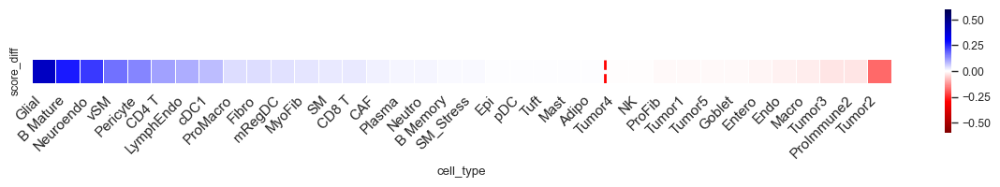

In [29]:
# Leiden measures - heatmap

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


merged = pd.merge(
    summary_df_stlens,
    summary_df_scanpy,
    on='cell_type',
    suffixes=('_stlens', '_scanpy')
    )

# Calculate correlation difference
merged['score_diff'] = merged['best_jaccard_stlens'] - merged['best_jaccard_scanpy']

# Sort by score difference
merged = merged.sort_values(by='score_diff', ascending=False).reset_index(drop=True)

# Prepare data for heatmap
heatmap_data = merged[['cell_type', 'score_diff']].set_index('cell_type').T

# Plot heatmap
plt.figure(figsize=(12, 2))

ax = sns.heatmap(
    heatmap_data,
    cmap='seismic_r',
    center=0,
    vmin=-0.6,
    vmax=0.6,
    annot=False,
    fmt='.2f',
    linewidths=0.5
    )

cell_labels = heatmap_data.columns

ax.set_xticks(np.arange(len(cell_labels)) + 0.5)

ax.set_xticklabels(cell_labels, rotation=45, ha='right', fontsize=11)

ax.set_aspect(aspect=1)

# red line
corrs = list(merged['score_diff'])

for i in range(len(corrs)-1):
    if corrs[i] * corrs[i+1] < 0:
        plt.axvline(x=i+1, color='red', linestyle='--', linewidth=2)
        break
plt.tight_layout()
plt.savefig('/bce/groups/pnucolab/analysis/scLENS/scLENS_paper_hm/figures/fix_results/main_heatmap_real2.pdf', dpi=300)
plt.show()

##### scatter plot

In [30]:
vibrant_colors_36 = [ '#FF0000', '#00FF00', '#0000FF', '#FFFF00', '#FF00FF', '#00FFFF', '#FF8000', '#8000FF', '#0080FF', "#4D2D14", '#FF0080', '#008000', '#800000', '#000080', '#808000', '#800080', '#008080', "#000000", '#FF4000', "#0C4900", '#4000FF', '#FF0040', "#00FF9D", "#8FABFF", '#FFFF80', '#FF80FF', '#80FFFF', '#FF8080', "#D980FF", "#985858", '#FF4080', "#424242", '#8040FF', '#FF8040', "#FFC400", '#4080FF' ]
stlens_adata.uns['Faria de Oliveira et al._colors'] = vibrant_colors_36

In [31]:
celltype_to_color = dict(zip(
    stlens_adata.obs['Faria de Oliveira et al.'].cat.categories,
    stlens_adata.uns['Faria de Oliveira et al._colors']
))

summary_df_stlens['colors'] = summary_df_stlens['cell_type'].map(celltype_to_color)
summary_df_scanpy['colors'] = summary_df_scanpy['cell_type'].map(celltype_to_color)

def unify_colors(group):
    max_color = group.loc[group['best_jaccard'].idxmax(), 'colors']
    group['colors'] = max_color
    return group

summary_df_stlens = summary_df_stlens.groupby(
    ['best_resolution', 'best_cluster'], group_keys=False
).apply(unify_colors)

summary_df_scanpy = summary_df_scanpy.groupby(
    ['best_resolution', 'best_cluster'], group_keys=False
).apply(unify_colors)

/tmp/ipykernel_2336373/3245682285.py:16: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(unify_colors)
/tmp/ipykernel_2336373/3245682285.py:20: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(unify_colors)


/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


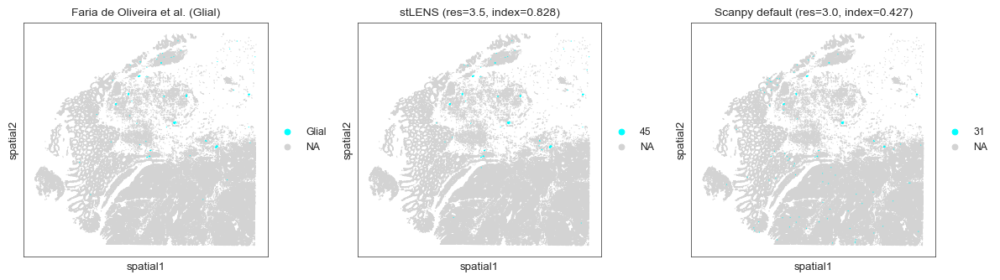

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


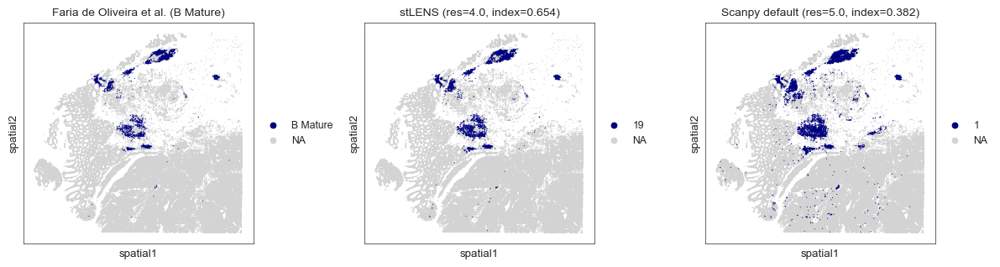

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


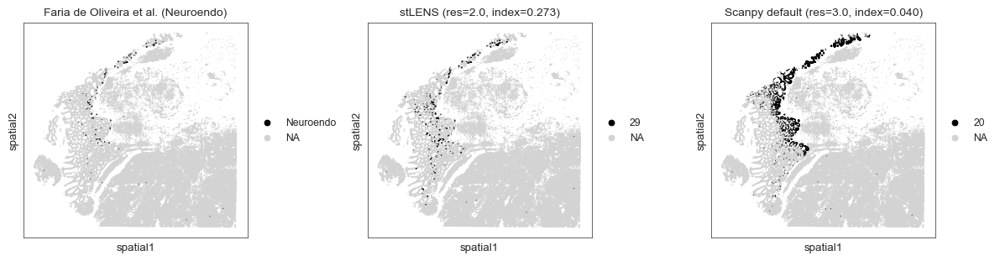

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


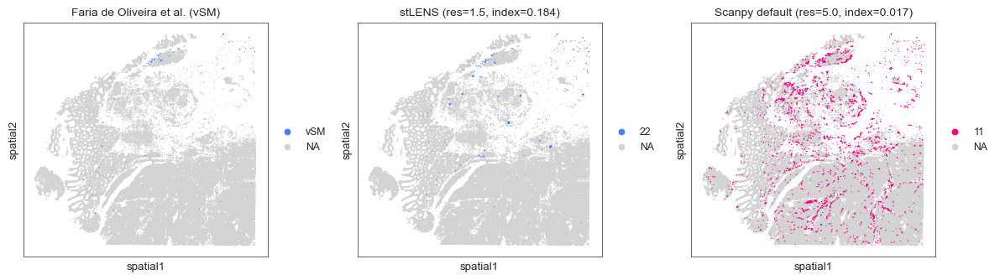

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


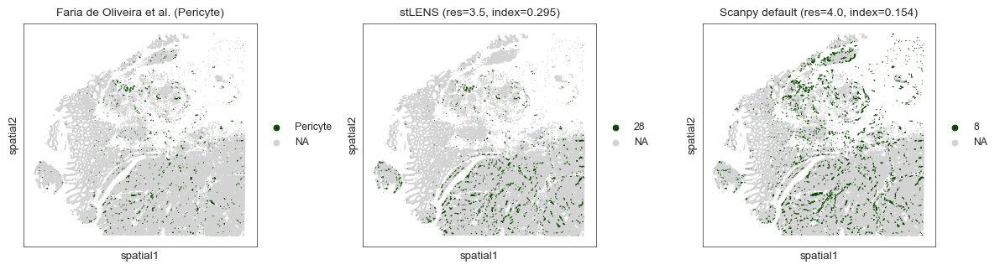

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


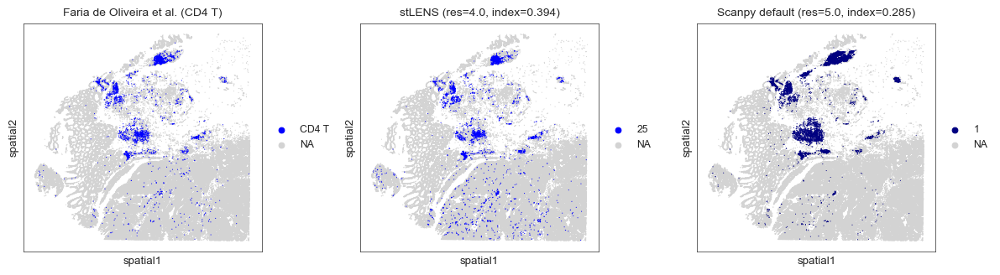

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


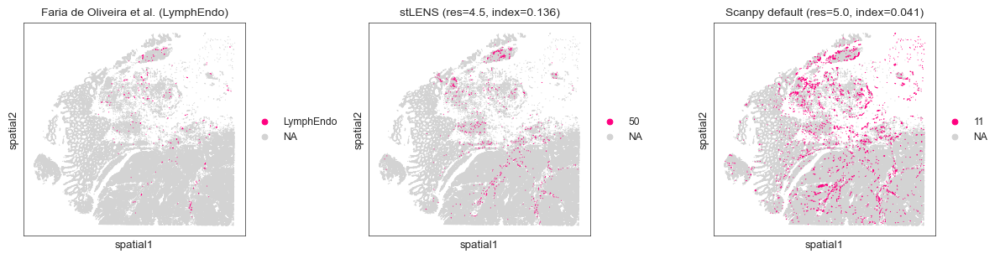

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


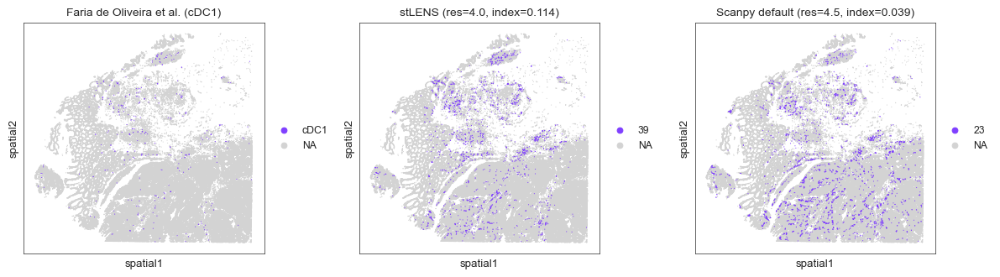

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


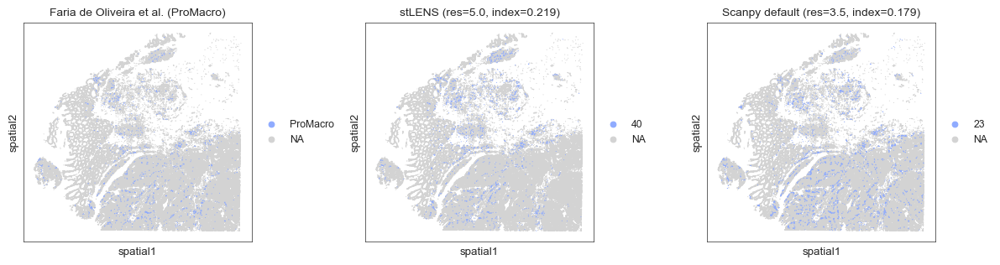

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


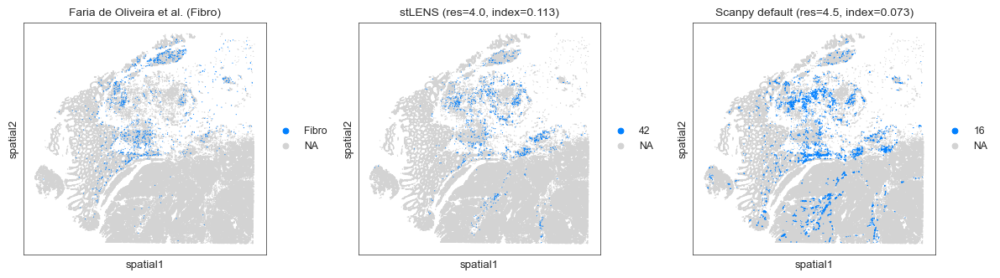

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


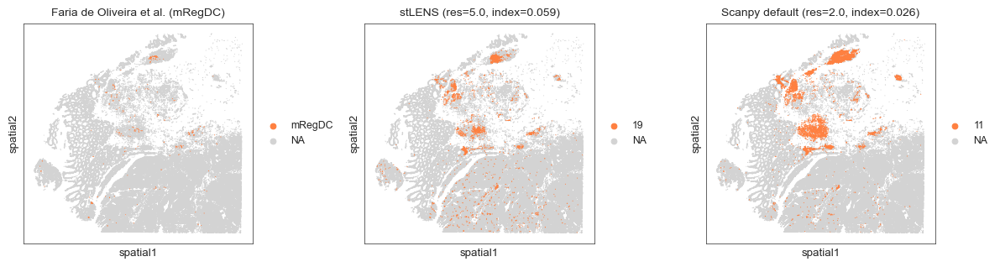

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


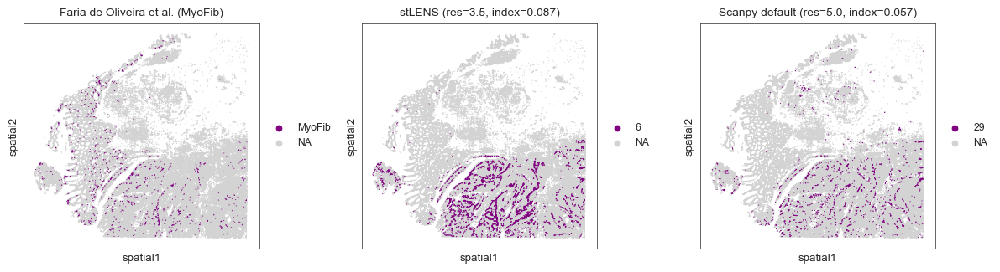

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


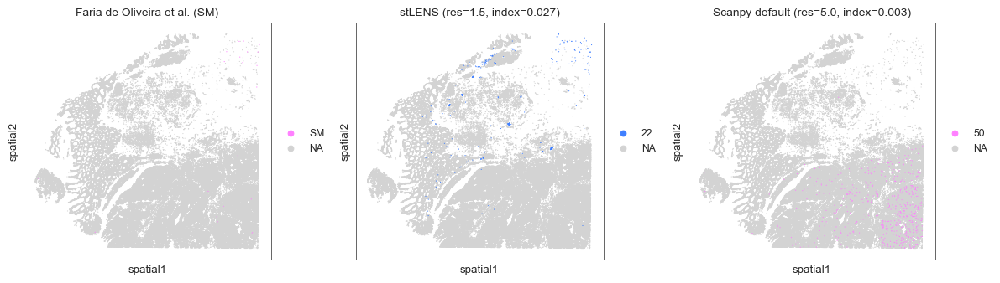

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


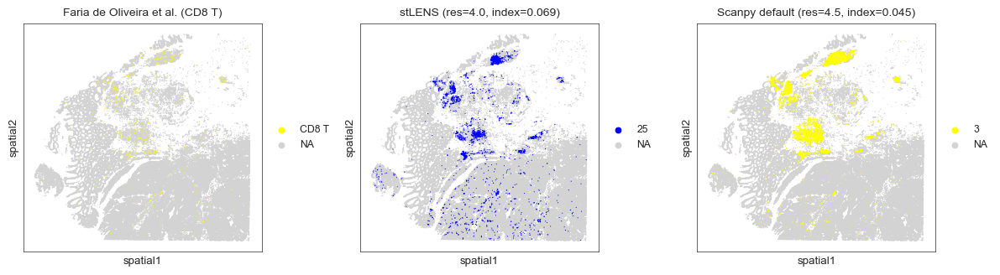

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


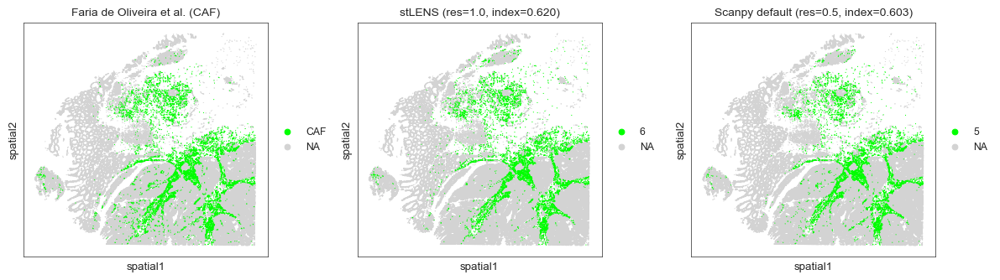

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


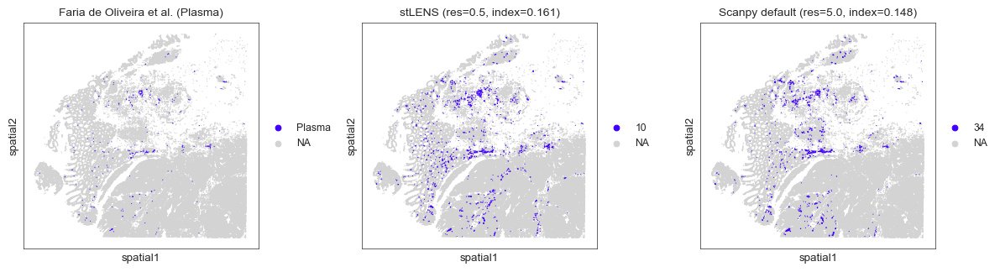

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


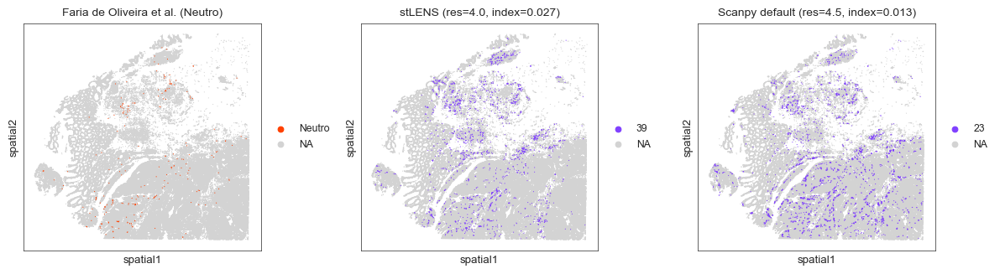

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


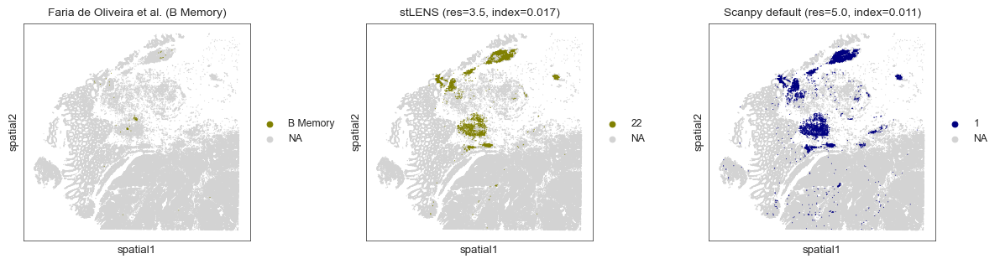

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


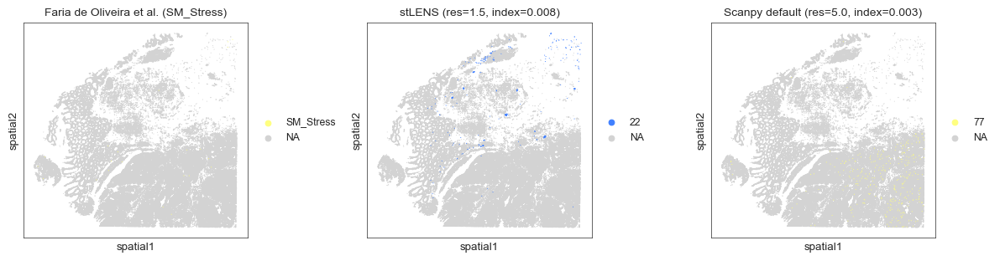

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


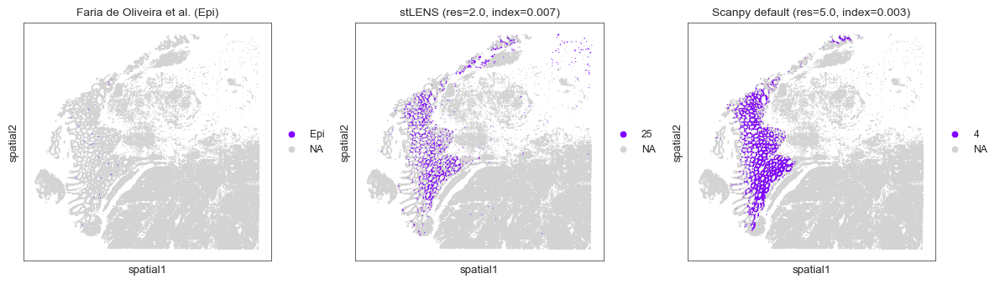

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


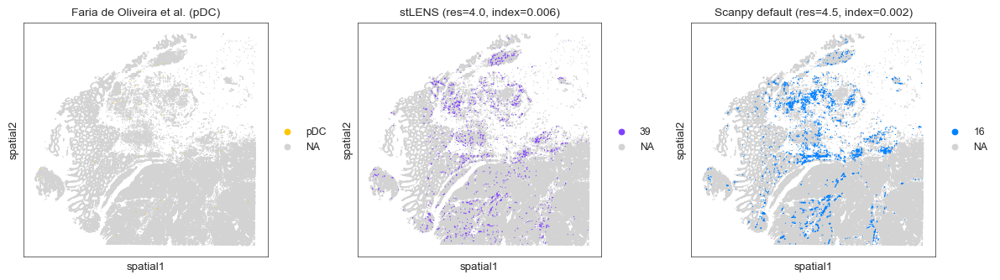

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


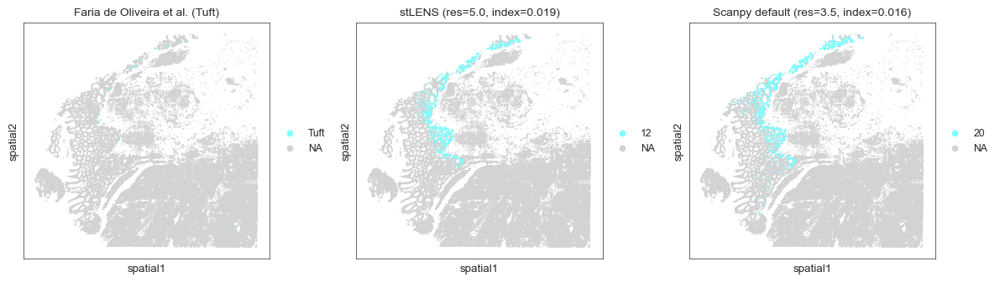

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


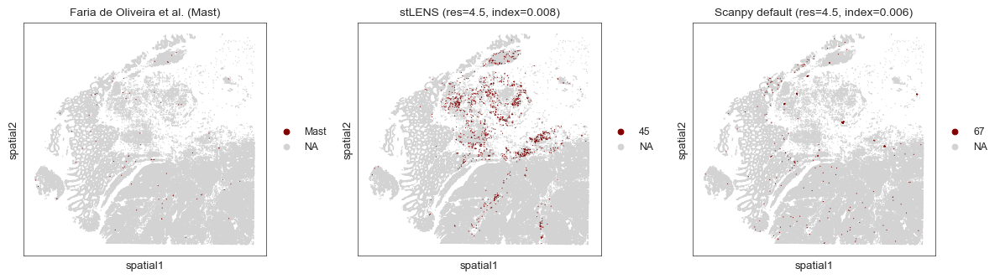

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


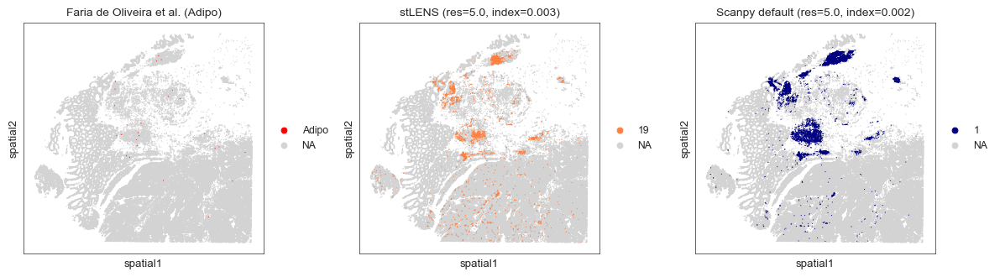

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


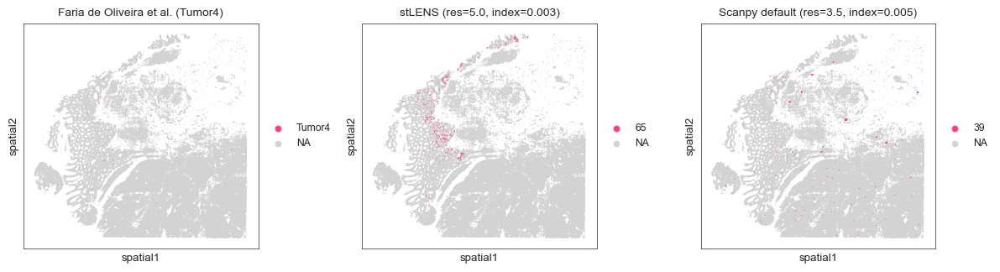

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


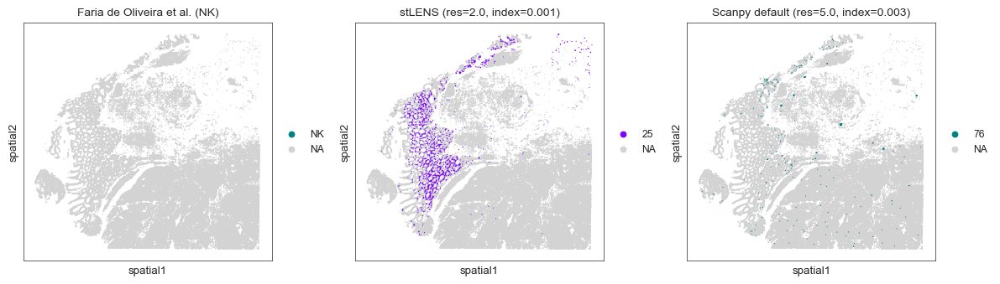

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


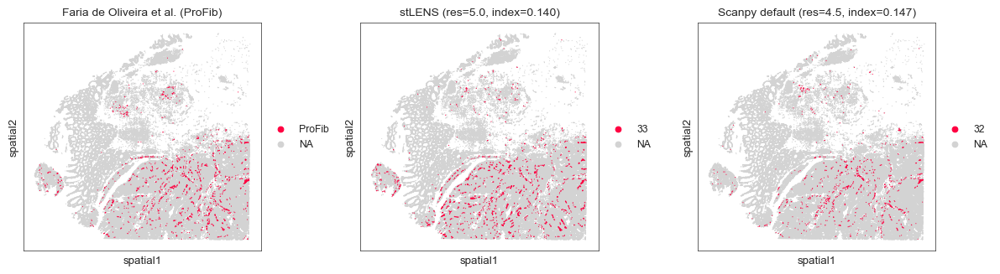

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


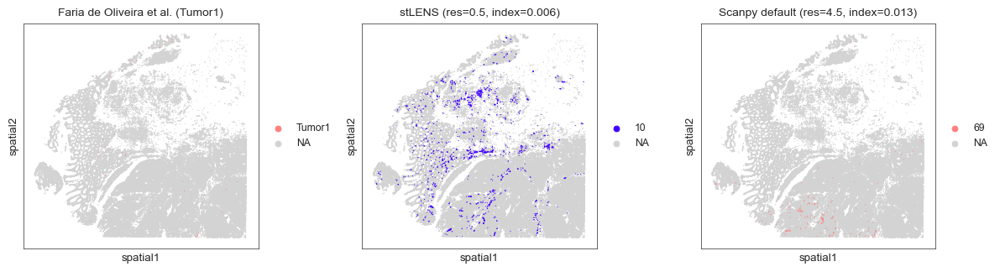

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


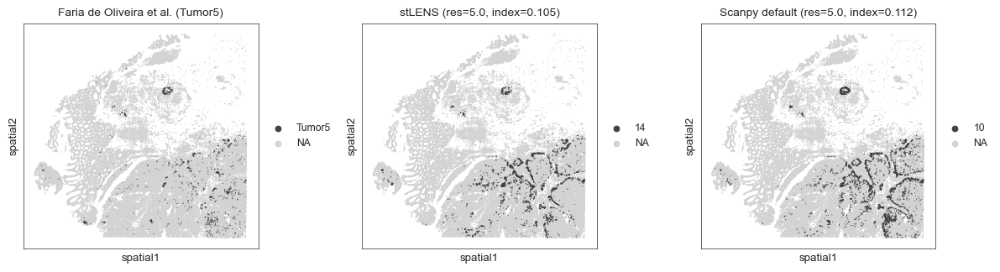

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


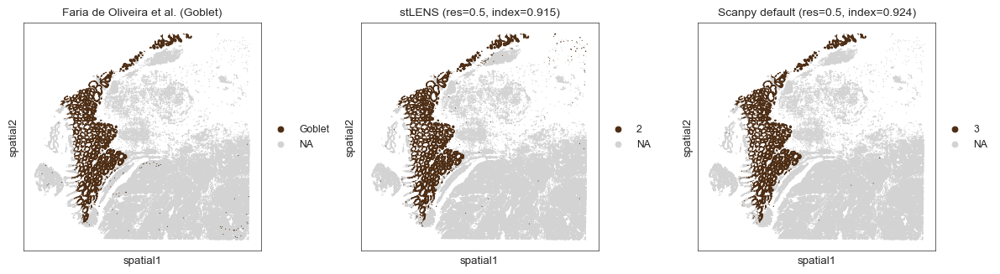

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


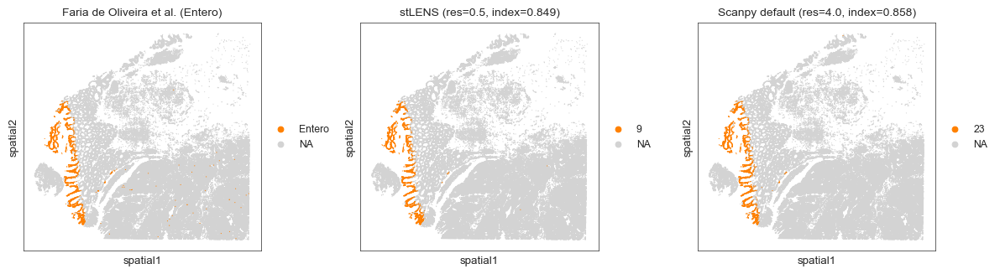

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


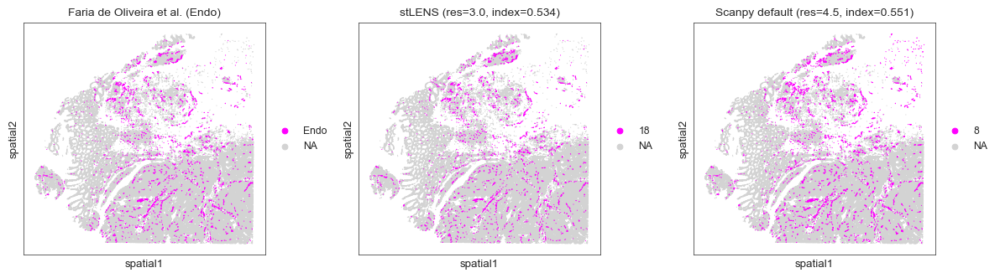

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


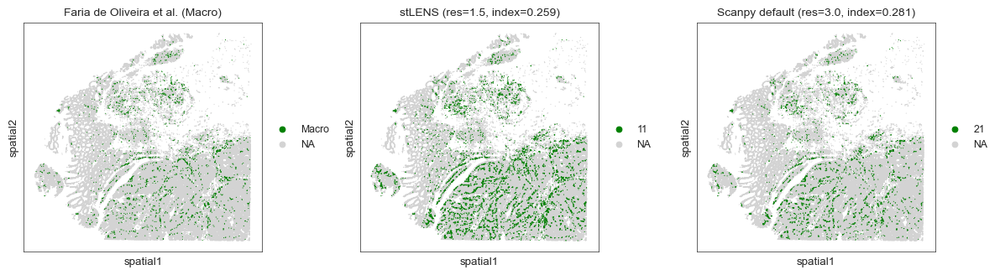

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


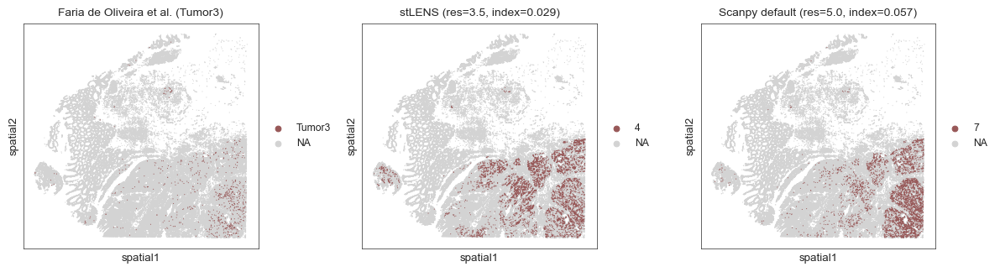

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


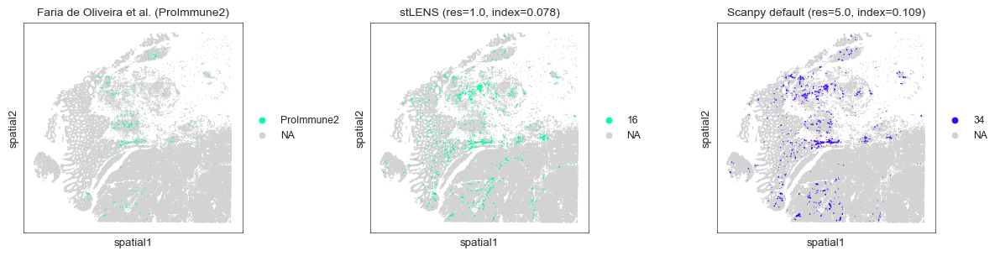

/tmp/ipykernel_2336373/985211535.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2336373/985211535.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


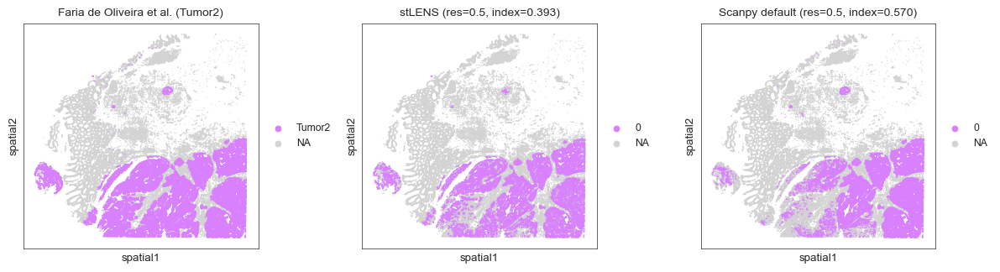

In [32]:
import matplotlib.pyplot as plt
import scanpy as sc

# Use the sorted order from heatmap for spatial plots
sorted_cell_types = merged['cell_type'].tolist()

for idx, i in enumerate(sorted_cell_types):
    df_stlens = summary_df_stlens[summary_df_stlens['cell_type'] == i]
    df_scanpy = summary_df_scanpy[summary_df_scanpy['cell_type'] == i]

    fig, axs = plt.subplots(1, 3, figsize=(12, 5))


    ## Faria de Oliveira et al

    gt_categories = stlens_adata.obs['Faria de Oliveira et al.'].cat.categories
    gt_palette = {
        ct: '#E0E0E0' if ct != i else celltype_to_color[ct]
        for ct in gt_categories
    }

    sc.pl.spatial(
        stlens_adata,
        color='Faria de Oliveira et al.',
        spot_size=100,
        groups=[i],
        ax=axs[0],
        show=False,
        palette=gt_palette
    )
    axs[0].set_title(f'Faria de Oliveira et al. ({i})', fontsize=10)


    ## stLENS

    stlens_cluster = str(df_stlens["best_cluster"].values[0])
    stlens_color = df_stlens["colors"].values[0]
    stlens_res = df_stlens["best_resolution"].values[0]
    stlens_corr = df_stlens["best_jaccard"].values[0]
    stlens_leiden_key = f'leiden_{stlens_res}'
    stlens_categories = stlens_adata.obs[stlens_leiden_key].cat.categories
    stlens_palette = {
        str(cat): '#E0E0E0' if str(cat) != stlens_cluster else stlens_color
        for cat in stlens_categories
    }

    sc.pl.spatial(
        stlens_adata,
        color=stlens_leiden_key,
        spot_size=100,
        groups=[stlens_cluster],
        ax=axs[1],
        show=False,
        palette=stlens_palette
    )
    axs[1].set_title(f'stLENS (res={stlens_res}, index={stlens_corr:.3f})', fontsize=10)


    ## Scanpy
    scanpy_cluster = str(df_scanpy["best_cluster"].values[0])
    scanpy_color = df_scanpy["colors"].values[0]
    scanpy_res = df_scanpy["best_resolution"].values[0]
    scanpy_corr = df_scanpy["best_jaccard"].values[0]
    scanpy_leiden_key = f'leiden_{scanpy_res}'
    scanpy_categories = scanpy_adata.obs[scanpy_leiden_key].cat.categories
    scanpy_palette = {
        str(cat): '#E0E0E0' if str(cat) != scanpy_cluster else scanpy_color
        for cat in scanpy_categories
    }

    sc.pl.spatial(
        scanpy_adata,
        color=scanpy_leiden_key,
        spot_size=100,
        groups=[scanpy_cluster],
        ax=axs[2],
        show=False,
        palette=scanpy_palette
    )
    axs[2].set_title(f'Scanpy default (res={scanpy_res}, index={scanpy_corr:.3f})', fontsize=10)


    plt.tight_layout()
    plt.savefig(
        f'/bce/groups/pnucolab/analysis/scLENS/scLENS_paper_hm/figures/fix_results/{idx+1:02d}_{i}.pdf',
        format='pdf', dpi=300, bbox_inches='tight'
    )
    plt.show()

#### silhouette score

In [ ]:
visium_stlens = stlens_adata
visium_scanpy = scanpy_adata

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import silhouette_score
from tqdm import tqdm


def _get_embedding_key(adata, candidates):
    for k in candidates:
        if k in adata.obsm_keys():
            return k
    raise KeyError(f'None of embedding keys {candidates} found in adata.obsm')


def compute_global_metrics(
    adata,
    embedding_key,
    resolutions=np.arange(0.5, 5.1, 0.5),
    silhouette_sample_size=10000,
    random_state=0,
):
    """Compute silhouette (reference-free) for every leiden_{res} key stored in adata.obs."""
    X = adata.obsm[embedding_key]

    records = []
    for res in tqdm(resolutions, desc='metrics'):
        leiden_key = f'leiden_{res:.1f}'
        if leiden_key not in adata.obs.columns:
            continue
        labels = adata.obs[leiden_key].astype(str).values

        n = len(labels)
        sample_size = min(silhouette_sample_size, n) if n > silhouette_sample_size else None
        try:
            sil = silhouette_score(
                X, labels, metric='cosine',
                sample_size=sample_size, random_state=random_state,
            )
        except Exception as e:
            sil = np.nan
            print(f'silhouette failed at res={res}: {e}')

        records.append({
            'resolution': res,
            'n_clusters': int(pd.Series(labels).nunique()),
            'silhouette': sil,
        })

    return pd.DataFrame(records)


In [ ]:
visium_emb_stlens = _get_embedding_key(visium_stlens, ['X_pca_stlens'])
visium_emb_scanpy = _get_embedding_key(visium_scanpy, ['X_pca'])
print('Embedding key (stLENS):', visium_emb_stlens)
print('Embedding key (Scanpy):', visium_emb_scanpy)

visium_metrics_stlens = compute_global_metrics(visium_stlens, visium_emb_stlens)
visium_metrics_scanpy = compute_global_metrics(visium_scanpy, visium_emb_scanpy)

visium_metrics_stlens['method'] = 'stLENS'
visium_metrics_scanpy['method'] = 'Scanpy (50 PCs)'
visium_metrics = pd.concat([visium_metrics_stlens, visium_metrics_scanpy], ignore_index=True)
visium_metrics


Embedding key (stLENS): X_pca_stlens
Embedding key (Scanpy): X_pca


metrics: 100%|██████████| 10/10 [00:12<00:00,  1.21s/it]


,resolution,n_clusters,silhouette,method
0,0.5,12,0.170715,stLENS
1,1.0,19,0.177606,stLENS
2,1.5,23,0.169190,stLENS
3,2.0,32,0.138722,stLENS
4,2.5,37,0.130321,stLENS
5,3.0,42,0.120136,stLENS
6,3.5,48,0.117473,stLENS
7,4.0,56,0.101245,stLENS
8,4.5,60,0.093151,stLENS
9,5.0,70,0.079252,stLENS


## STOmics

In [ ]:
from stLENS import stLENS
stlens = stLENS()

### Load data

In [ ]:
!wget -P ./data/stomics https://ftp.cngb.org/pub/SciRAID/stomics/STDS0000058/stomics/E16.5_E1S3_cell_bin_whole_brain.h5ad 

--2025-07-26 20:37:56--  https://ftp.cngb.org/pub/SciRAID/stomics/STDS0000058/stomics/E16.5_E1S3_cell_bin_whole_brain.h5ad
Resolving ftp.cngb.org (ftp.cngb.org)... 101.126.80.204
Connecting to ftp.cngb.org (ftp.cngb.org)|101.126.80.204|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 732847864 (699M) [application/octet-stream]
Saving to: ‘./data/stomics/E16.5_E1S3_cell_bin_whole_brain.h5ad’

E16.5_E1S3_cell_bin 100%[===================>] 698.90M  1.41MB/s    in 86m 50s 

2025-07-26 22:07:24 (137 KB/s) - ‘./data/stomics/E16.5_E1S3_cell_bin_whole_brain.h5ad’ saved [732847864/732847864]



In [ ]:
import scanpy as sc
adata = sc.read_h5ad('./data/stomics/E16.5_E1S3_cell_bin_whole_brain.h5ad')
adata

AnnData object with n_obs × n_vars = 65303 × 23368
    obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation'
    var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts'
    uns: 'sim anno_colors'
    obsm: 'spatial'
    layers: 'counts'

### Quality Control

Filtering with Scanpy (conventional method):

In [ ]:
import scanpy as sc

adata.X = adata.layers["counts"].copy()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=15)
adata

AnnData object with n_obs × n_vars = 65303 × 19182
    obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes'
    var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'sim anno_colors'
    obsm: 'spatial'
    layers: 'counts'

### Normalization & PCA

stLENS

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


sparsity_th: 0.03009612116808877


/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


Min(corr): 0.03359541669487953, sparsity: 0.999


/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


Min(corr): 0.030008085072040558, sparsity: 0.998


/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


Min(corr): 0.029032163321971893, sparsity: 0.997


/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


Min(corr): 0.02849838323891163, sparsity: 0.996


/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


Min(corr): 0.027887610718607903, sparsity: 0.995


/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


Min(corr): 0.02745412290096283, sparsity: 0.994
Max interactions exceeded!
lambda_c: 7.377504879789683
Number of signal: 195


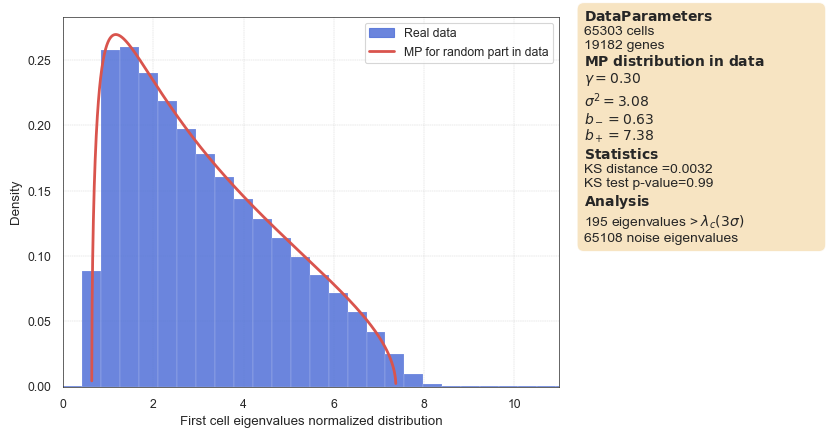

  0%|          | 0/20 [00:00<?, ?it/s]/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
  5%|▌         | 1/20 [00:32<10:23, 32.82s/it]/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
 10%|█         | 2/20 [01:05<09:51, 32.88s/it]/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
 15%|█▌        | 3/20 [01:38<09:17, 32.78s/it]/home/l202255179/micromamba/envs/stLENS/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs

number of filtered signals: 38


38

In [ ]:
stlens.find_optimal_pc(adata, plot_mp = True, device='gpu', tmp_directory='./output/stomics')

In [ ]:
stlens_adata = stlens.pca(adata, inplace=False)
stlens_adata

AnnData object with n_obs × n_vars = 65303 × 19182
    obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes'
    var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'sim anno_colors', 'stlens'
    obsm: 'spatial', 'X_pca_stlens'
    layers: 'counts'

scanpy

In [ ]:
import scanpy as sc
adata = sc.read_h5ad('./data/stomics/E16.5_E1S3_cell_bin_whole_brain.h5ad')
adata.X = adata.layers["counts"].copy()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=15)
adata

AnnData object with n_obs × n_vars = 65303 × 19182
    obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes'
    var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'sim anno_colors'
    obsm: 'spatial'
    layers: 'counts'

In [ ]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

scanpy_adata = sc.pp.pca(adata, copy=True)
scanpy_adata

AnnData object with n_obs × n_vars = 65303 × 19182
    obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes'
    var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'sim anno_colors', 'log1p', 'pca'
    obsm: 'spatial', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

### KNN & UMAP embedding & Leiden Clustering

In [ ]:
# KNN
sc.pp.neighbors(stlens_adata, use_rep='X_pca_stlens', metric='cosine')
sc.pp.neighbors(scanpy_adata, use_rep='X_pca')

# UMAP embedding
sc.tl.umap(stlens_adata)
sc.tl.umap(scanpy_adata)

In [ ]:
stlens_adata, scanpy_adata

(AnnData object with n_obs × n_vars = 65303 × 19182
     obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes'
     var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
     uns: 'sim anno_colors', 'stlens', 'neighbors', 'umap'
     obsm: 'spatial', 'X_pca_stlens', 'X_umap'
     layers: 'counts'
     obsp: 'distances', 'connectivities',
 AnnData object with n_obs × n_vars = 65303 × 19182
     obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes'
     var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
     uns: 'sim anno_colors', 'log1p', 'pca', 'neighbors', 'umap'
     obsm: 'spatial', 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'counts'
     obsp: 'distances', 'connectivities')

In [ ]:
# Leiden Clustering across resolutions
import numpy as np
from tqdm import tqdm

def leiden_loop(adata):
    res_range = np.arange(0.5, 5.1, 0.5)
    for res in tqdm(res_range, desc="Leiden clustering", unit="res"):
        leiden_key = f"leiden_{res:.1f}"
        if leiden_key not in adata.obs:
            sc.tl.leiden(adata, resolution=res, key_added=leiden_key)

leiden_loop(stlens_adata)
leiden_loop(scanpy_adata)
stlens_adata, scanpy_adata

In [ ]:
# Leiden Clustering across resolutions
import numpy as np
def leiden_loop(adata):
    res_range=np.arange(0.5, 5.1, 0.5)
    for res in res_range:
        leiden_key = f"leiden_{res:.1f}"
        if leiden_key not in adata.obs:
            sc.tl.leiden(adata, resolution=res, key_added=leiden_key)

leiden_loop(stlens_adata)
leiden_loop(scanpy_adata)
stlens_adata, scanpy_adata

/tmp/ipykernel_2765066/1236860612.py:9: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=res, key_added=leiden_key)


(AnnData object with n_obs × n_vars = 65303 × 19182
     obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0'
     var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
     uns: 'sim anno_colors', 'stlens', 'neighbors', 'umap', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0'
     obsm: 'spatial', 'X_pca_stlens', 'X_umap'
     layers: 'counts'
     obsp: 'distances', 'connectivities',
 AnnData object with n_obs × n_vars = 65303 × 19182
     obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leide

In [ ]:
stlens_adata.write_h5ad('./output/stomics/stlens_adata')
scanpy_adata.write_h5ad('./output/stomics/scanpy_adata')

### Figures

In [ ]:
import matplotlib as plt

plt.rcParams['font.family'] = 'Arial'

In [ ]:
# Excluded cells annotated as 'unknown' and applied label shortening

mask = stlens_adata.obs['annotation'] != 'Unknown'
stlens_adata = stlens_adata[mask].copy()

mask = scanpy_adata.obs['annotation'] != 'Unknown'
scanpy_adata = scanpy_adata[mask].copy()

name_map = {
    'Cajal-Retzius cell': 'Cajal',
    'Cerebellar granule neuroblasts': 'Cerebellar GN',
    'Choroid plexus': 'Choroid',
    'Cortical glutamatergic neuron': 'Ctx Glu neuron',
    'Cortical intermediate progenitor': 'Ctx IP',
    'Cortical or hippocampal glutamatergic neuron': 'Ctx/Hip Glu neuron',
    'Cranium fibroblast': 'Cranium FB',
    'Diencephalon glutamatergic neuron': 'Dience Glu neuron',
    'Dopaminergic neuron': 'DA neuron',
    'Dorsal hindbrain radial glia': 'Dorsal HB RG',
    'Endothelial cell': 'Endo',
    'Epidermis': 'Epid',
    'Erythrocyte': 'RBC',
    'Fibroblast': 'FB',
    'Forebrain GABAergic neuroblast': 'FB GABA NB',
    'Forebrain GABAergic neuron': 'FB GABA neuron',
    'Forebrain glutamatergic neuroblast': 'FB Glu NB',
    'Forebrain neuroblast': 'FB NB',
    'Forebrain radial glia': 'FB RG',
    'Hindbrain glioblast': 'HB GB',
    'Hindbrain glutamatergic neuroblast': 'HB Glu NB',
    'Hindbrain glutamatergic neuron': 'HB Glu neuron',
    'Hindbrain neuroblast': 'HB NB',
    'Hypothalamus neuron': 'Hypo neuron',
    'Midbrain glutamatergic neuroblast': 'MB Glu NB',
    'Midbrain glutamatergic neuron': 'MB Glu neuron',
    'Midbrain radial glia': 'MB RG',
    'Mixed region GABAergic neuron': 'Mixed GABA neuron',
    'Mixed region glioblast': 'Mixed GB',
    'Mixed region neuron': 'Mixed neuron',
    'Motor neuron': 'Motor neuron',
    'Olfactory neuron': 'Olf neuron',
    'Ventromedial hypothalamus GABAergic neuron': 'VMH GABA neuron'
}

stlens_adata.obs['Chen et al.'] = stlens_adata.obs['annotation'].replace(name_map)
scanpy_adata.obs['Chen et al.'] = scanpy_adata.obs['annotation'].replace(name_map)
stlens_adata, scanpy_adata

/tmp/ipykernel_2770742/2901508644.py:45: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  stlens_adata.obs['Chen et al.'] = stlens_adata.obs['annotation'].replace(name_map)
/tmp/ipykernel_2770742/2901508644.py:46: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  scanpy_adata.obs['Chen et al.'] = scanpy_adata.obs['annotation'].replace(name_map)


(AnnData object with n_obs × n_vars = 64718 × 19182
     obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0', 'Chen et al.'
     var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
     uns: 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0', 'neighbors', 'sim anno_colors', 'stlens', 'umap'
     obsm: 'X_pca_stlens', 'X_umap', 'spatial'
     layers: 'counts'
     obsp: 'connectivities', 'distances',
 AnnData object with n_obs × n_vars = 64718 × 19182
     obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leid

#### Ground Truth based measures

/tmp/ipykernel_2770742/145578422.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  src = label_codes[i]
/tmp/ipykernel_2770742/145578422.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  neighbor_labels = label_codes[neighbors]
/tmp/ipykernel_2770742/145578422.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  src = label_codes[i]
/tmp/ipykernel_2770742/145578422.py:24: FutureWarning: Series.__getitem__ treating keys as posi

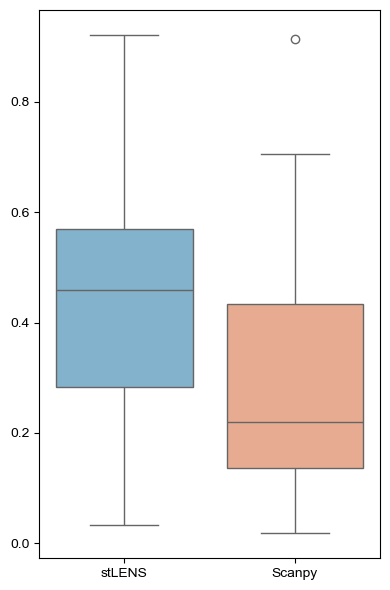

In [ ]:
import seaborn as sns
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
from collections import defaultdict

def neighbor_confusion_matrix(adata, label_key='cell_name', k=15):
    conn = adata.obsp['connectivities'].tolil()
    labels = adata.obs[label_key].astype('category')
    label_codes = labels.cat.codes
    label_names = labels.cat.categories
    n_labels = len(label_names)

    mat = np.zeros((n_labels, n_labels))  

    for i in range(adata.n_obs):
        src = label_codes[i] 
        neighbors = conn.rows[i] 
        neighbors = [j for j in neighbors if j != i]  
        if not neighbors:
            continue
        neighbor_labels = label_codes[neighbors]
        for tgt in neighbor_labels:
            mat[src, tgt] += 1
    mat = mat / mat.sum(axis=1, keepdims=True)
    return pd.DataFrame(mat, index=label_names, columns=label_names)

conf_mat_stlens = neighbor_confusion_matrix(stlens_adata, label_key = 'Chen et al.')
conf_mat_scanpy = neighbor_confusion_matrix(scanpy_adata, label_key = 'Chen et al.')

conf_mat_sctlens_diagonal_values = np.diag(conf_mat_stlens.values)
conf_mat_scanpy_diagonal_values = np.diag(conf_mat_scanpy.values)


lst = [list(conf_mat_sctlens_diagonal_values), list(conf_mat_scanpy_diagonal_values)]
x_labels = ['stLENS', 'Scanpy']

df = pd.DataFrame({
    'value': lst[0] + lst[1],
    'method': [x_labels[0]] * len(lst[0]) + [x_labels[1]] * len(lst[1])
})

palette = {
    'stLENS': '#77b5d9',   
    'Scanpy': '#f4a582'    
}

plt.figure(figsize=(4, 6))
sns.boxplot(data=df, x='method', y='value', palette=palette)

plt.xlabel('')
plt.ylabel('')
plt.tight_layout()
plt.savefig('./output/stomics/boxplot.pdf', dpi=300)

#### Leiden measures

In [ ]:
from sklearn.metrics import jaccard_score
import numpy as np
import pandas as pd
from tqdm import tqdm

def optimize_resolution_for_all_celltypes_jaccard(
    adata,
    average,
    annotation_key='annotation',
    res_range=np.arange(0.5, 5.1, 0.5)
):
    summary = []
    cell_types = adata.obs[annotation_key].cat.categories

    for cell_type in tqdm(cell_types, desc="Processing cell types"):
        jaccard_scores = []
        best_clusters = []
        resolutions_checked = []

        gt_mask = adata.obs[annotation_key] == cell_type
        if gt_mask.sum() == 0:
            continue

        for res in res_range:
            leiden_key = f"leiden_{res:.1f}"
            if leiden_key not in adata.obs.columns:
                continue
            
            cluster_names = adata.obs[leiden_key].cat.categories
            best_jaccard = -1
            best_cluster = None

            for cluster in cluster_names:
                pred_mask = adata.obs[leiden_key] == cluster

                _, score = jaccard_score(gt_mask, pred_mask, average=average)
                if score > best_jaccard:
                    best_jaccard = score
                    best_cluster = cluster

            jaccard_scores.append(best_jaccard)
            best_clusters.append(best_cluster)
            resolutions_checked.append(res)

        df = pd.DataFrame({
            'resolution': resolutions_checked,
            'jaccard': jaccard_scores,
            'best_cluster': best_clusters
        })

        best_idx = df['jaccard'].idxmax()
        best_row = df.loc[best_idx]
        summary.append({
            'cell_type': cell_type,
            'best_resolution': best_row['resolution'],
            'best_cluster': best_row['best_cluster'],
            'best_jaccard': best_row['jaccard']
        })

    return pd.DataFrame(summary)

summary_df_stlens = optimize_resolution_for_all_celltypes_jaccard(
    stlens_adata, 
    annotation_key = 'Chen et al.', 
    average = None)

summary_df_scanpy = optimize_resolution_for_all_celltypes_jaccard(
    scanpy_adata, 
    annotation_key = 'Chen et al.', 
    average = None)

Processing cell types: 100%|██████████| 33/33 [06:21<00:00, 11.57s/it]


##### heatmap

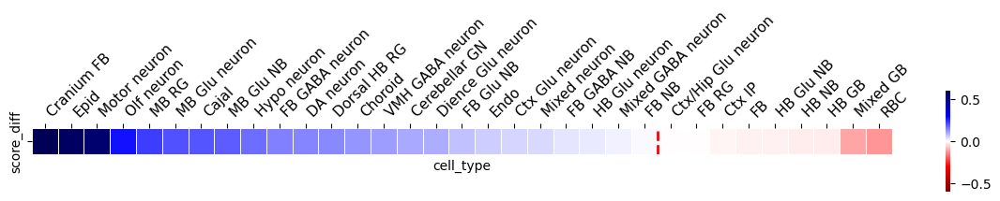

In [ ]:
# Leiden measures - heatmap

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


merged = pd.merge(
    summary_df_stlens,
    summary_df_scanpy,
    on='cell_type',
    suffixes=('_stlens', '_scanpy')
    )

# Calculate correlation difference
merged['score_diff'] = merged['best_jaccard_stlens'] - merged['best_jaccard_scanpy']

# Sort by score difference
merged = merged.sort_values(by='score_diff', ascending=False).reset_index(drop=True)

# Prepare data for heatmap
heatmap_data = merged[['cell_type', 'score_diff']].set_index('cell_type').T

# Plot heatmap
plt.figure(figsize=(12, 2))

ax = sns.heatmap(
    heatmap_data,
    cmap='seismic_r',
    center=0,
    vmin=-0.6,
    vmax=0.6,
    annot=False,
    fmt='.2f',
    linewidths=0.5
    )

cell_labels = heatmap_data.columns

ax.set_xticks(np.arange(len(cell_labels)) + 0.5)

ax.set_xticklabels(cell_labels, rotation=45, ha='left', fontsize=11)

ax.set_aspect(aspect=1)
ax.xaxis.tick_top()  
ax.xaxis.set_tick_params(bottom=False,  
                         top=True)

# red line
corrs = list(merged['score_diff'])

for i in range(len(corrs)-1):
    if corrs[i] * corrs[i+1] < 0:
        plt.axvline(x=i+1, color='red', linestyle='--', linewidth=2)
        break
plt.tight_layout()
plt.savefig('./output/stomics/main_heatmap.pdf', dpi=300)
plt.show()

##### Scatter plot

In [ ]:
vibrant_colors_33 = ['#ffff00','#1ce6ff','#ff34ff','#ff4a46', '#008941', '#006fa6', '#a30059', '#ff1493', '#7a4900', '#0000a6', '#63ffac', '#b79762',
 '#004d43', '#8fb0ff', '#997d87', '#5a0007', '#809693', '#6a3a4c', '#1b4400', '#4fc601', '#3b5dff', '#4a3b53', '#ff2f80', '#61615a', '#ba0900',
 '#6b7900', '#00c2a0', '#ffaa92', '#ff90c9', '#b903aa', '#d16100', '#1e90ff', '#000035']
stlens_adata.uns['Chen et al._colors'] = vibrant_colors_33

In [ ]:
celltype_to_color = dict(zip(
    stlens_adata.obs['Chen et al.'].cat.categories,
    stlens_adata.uns['Chen et al._colors']
))

summary_df_stlens['colors'] = summary_df_stlens['cell_type'].map(celltype_to_color)
summary_df_scanpy['colors'] = summary_df_scanpy['cell_type'].map(celltype_to_color)

def unify_colors(group):
    max_color = group.loc[group['best_jaccard'].idxmax(), 'colors']
    group['colors'] = max_color
    return group

summary_df_stlens = summary_df_stlens.groupby(
    ['best_resolution', 'best_cluster'], group_keys=False
).apply(unify_colors)

summary_df_scanpy = summary_df_scanpy.groupby(
    ['best_resolution', 'best_cluster'], group_keys=False
).apply(unify_colors)

/tmp/ipykernel_2770742/80698760.py:16: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(unify_colors)
/tmp/ipykernel_2770742/80698760.py:20: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(unify_colors)


/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


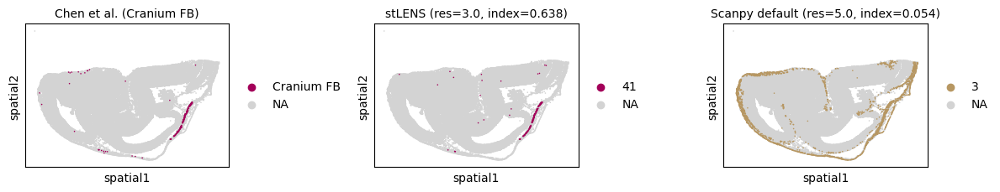

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


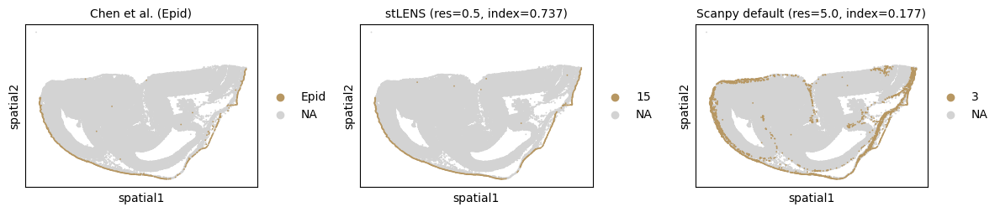

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


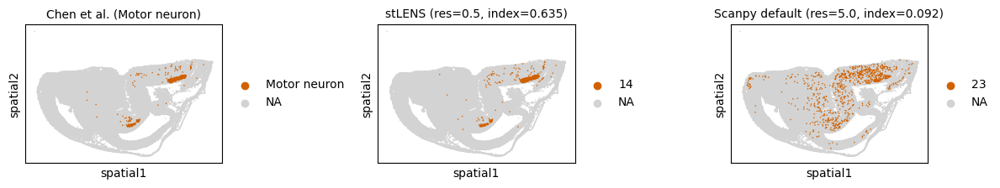

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


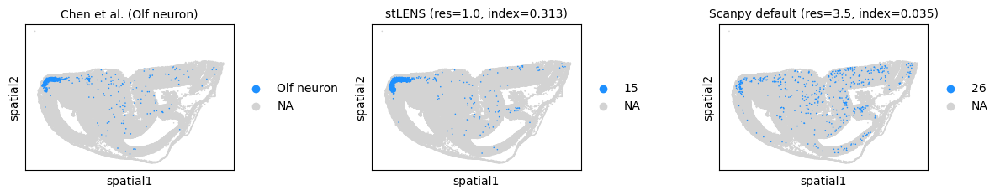

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


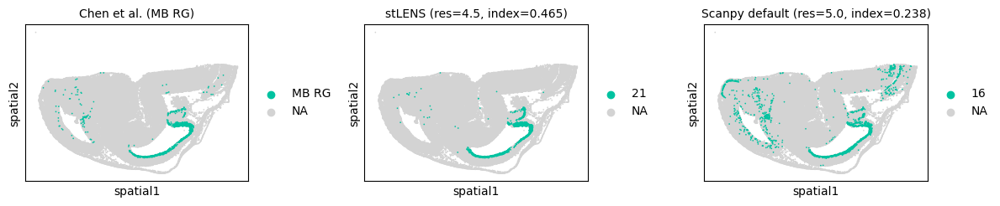

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


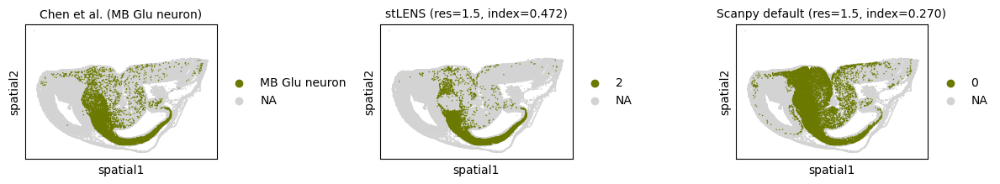

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


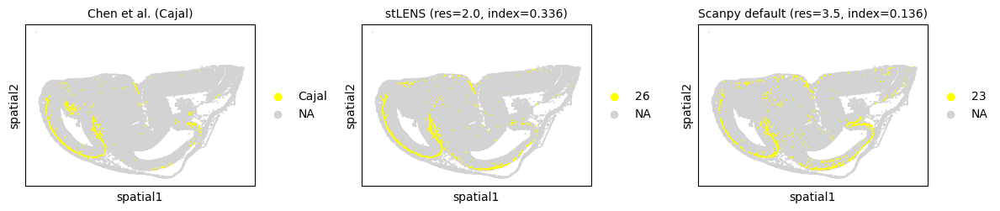

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


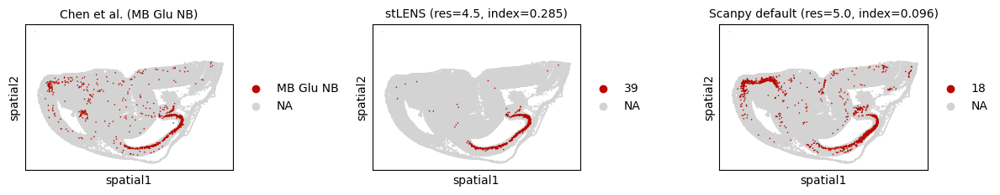

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


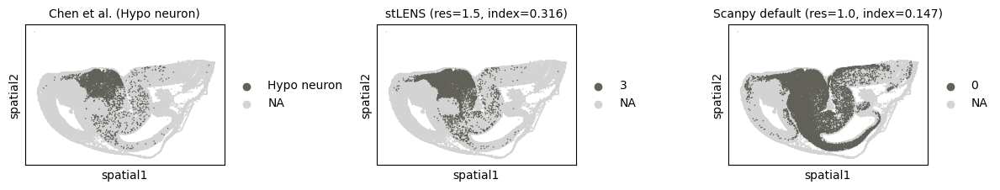

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


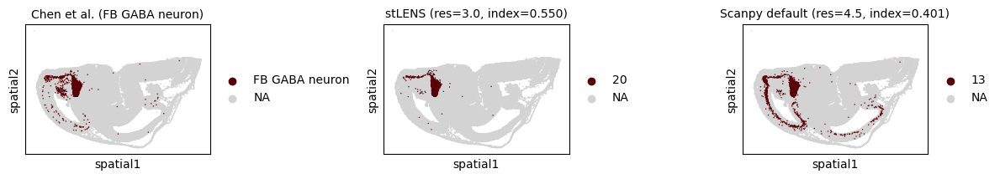

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


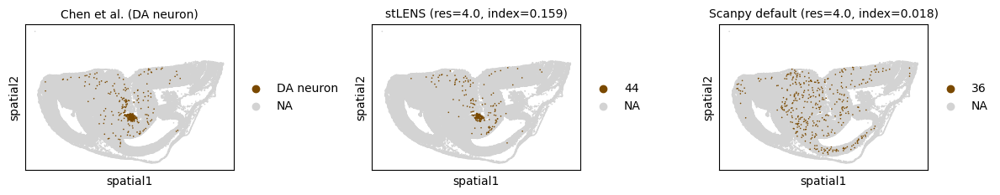

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


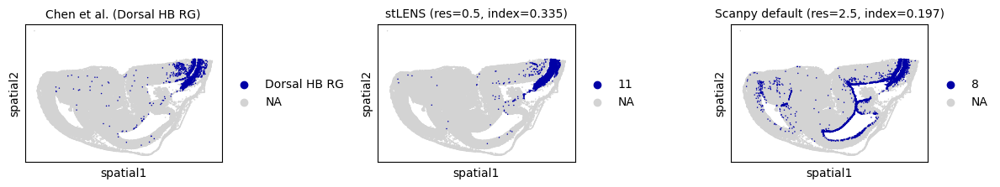

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


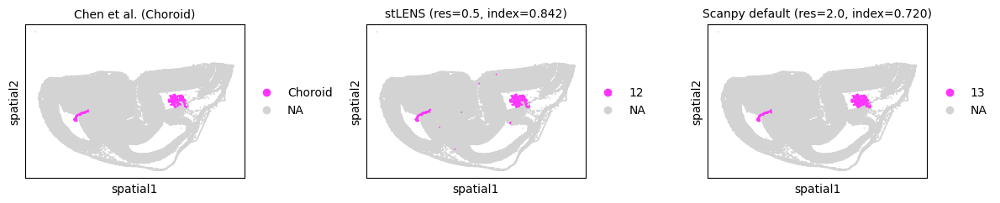

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


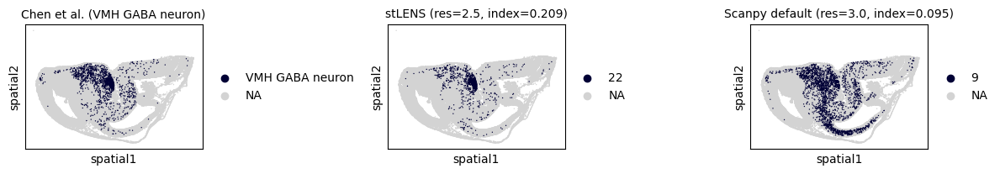

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


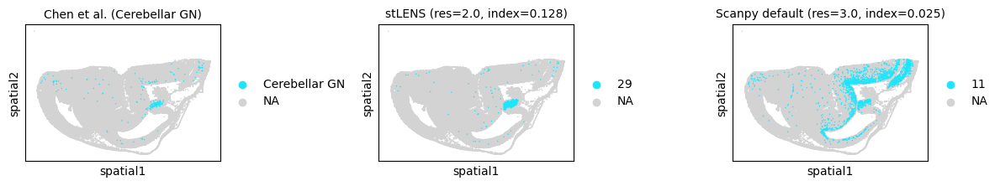

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


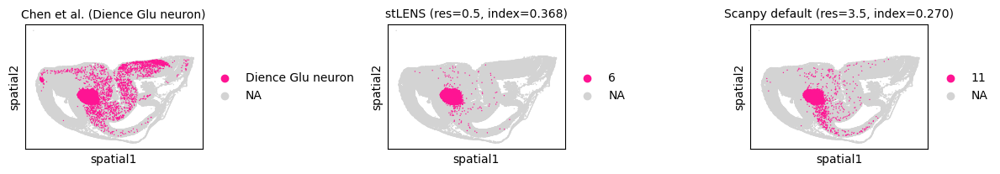

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


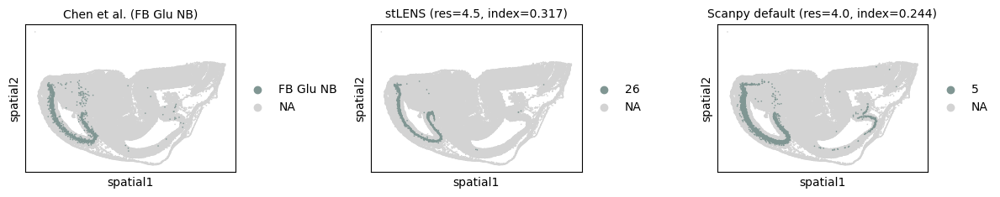

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


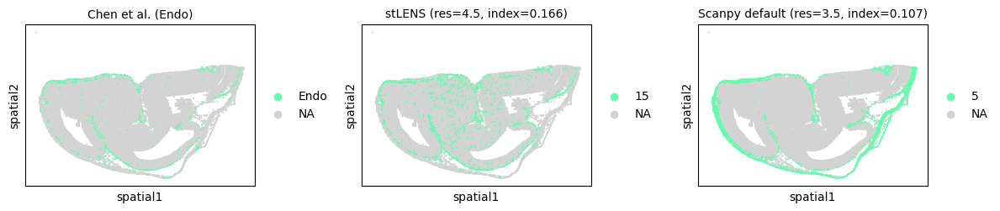

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


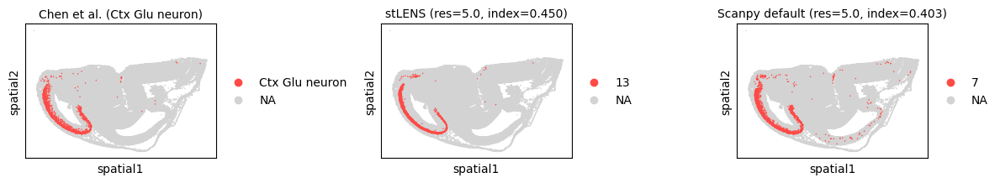

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


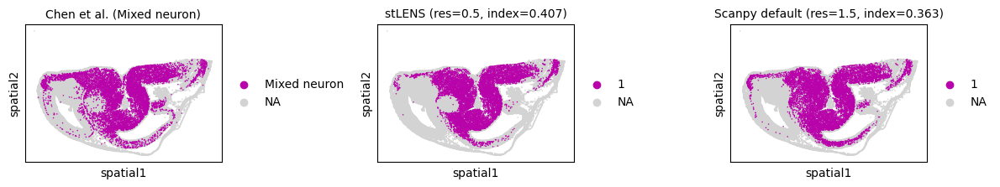

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


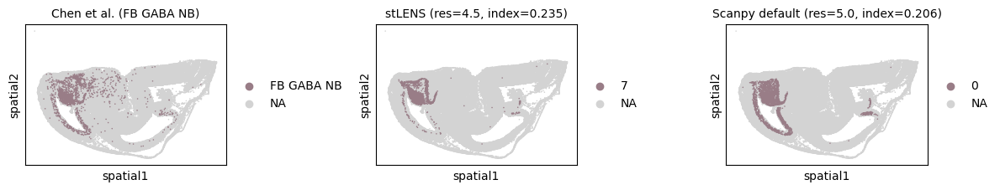

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


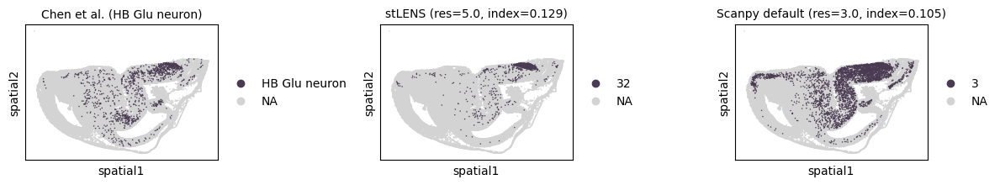

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


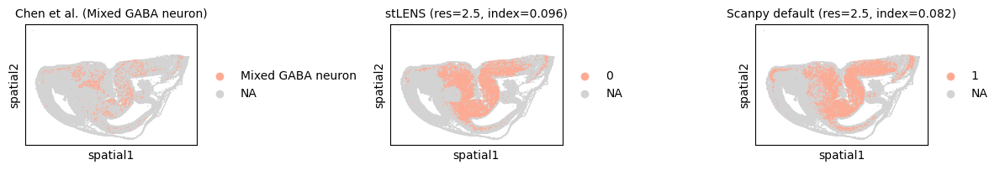

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


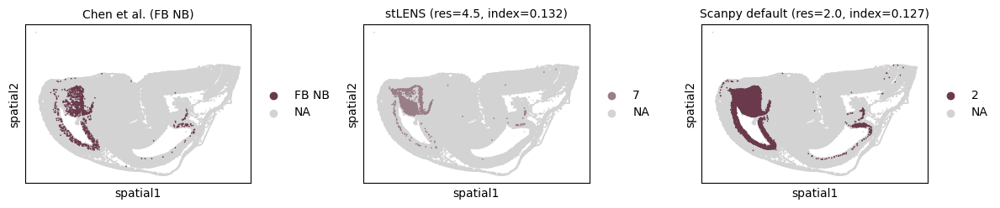

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


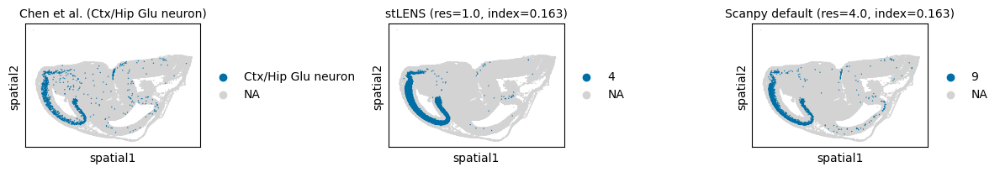

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


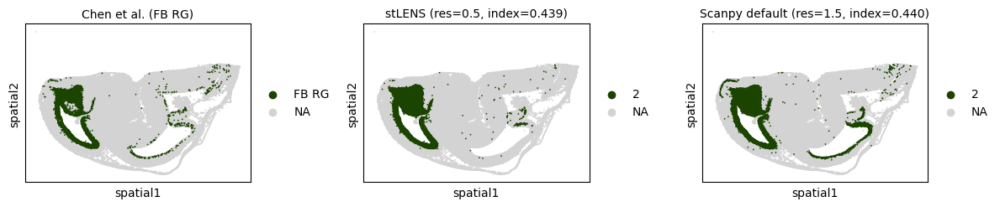

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


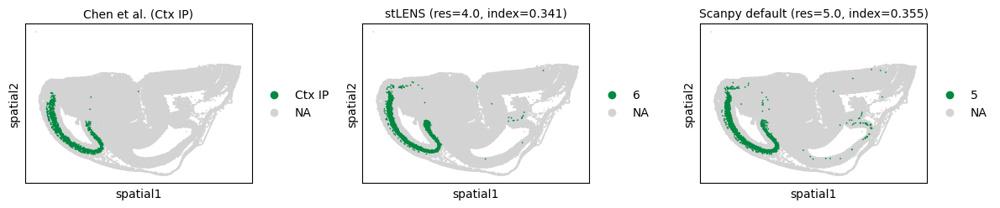

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


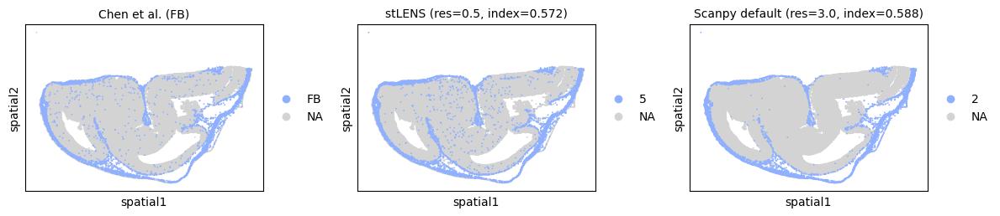

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


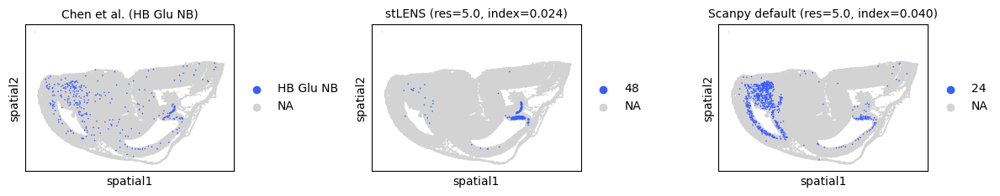

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


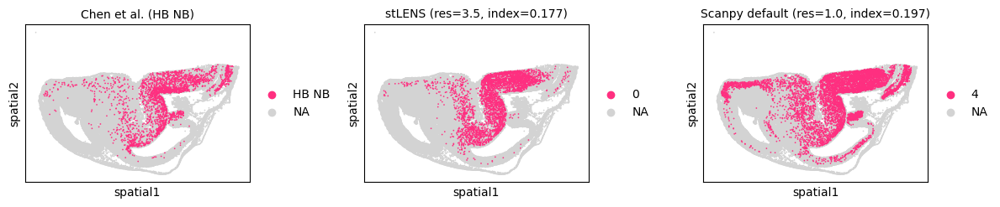

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


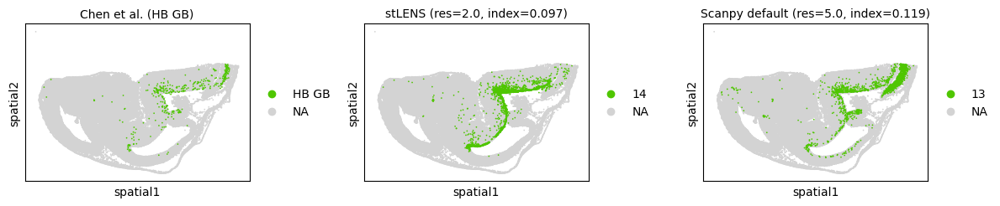

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


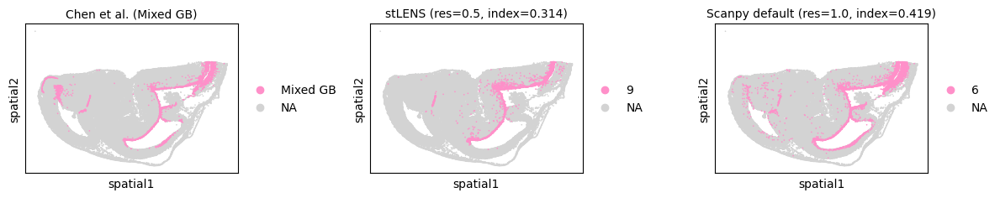

/tmp/ipykernel_2941109/1910446894.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:47: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
/tmp/ipykernel_2941109/1910446894.py:71: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


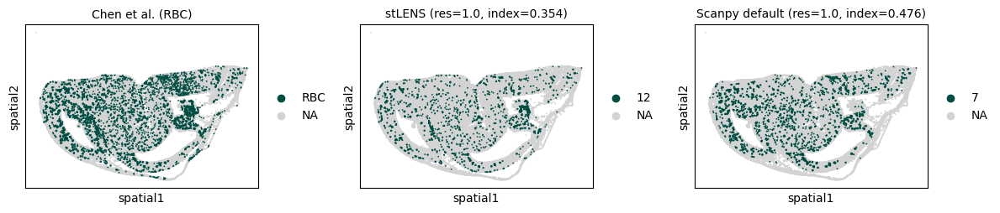

In [ ]:
import matplotlib.pyplot as plt
import scanpy as sc

# Use the sorted order from heatmap for spatial plots
sorted_cell_types = merged['cell_type'].tolist()

for idx, i in enumerate(sorted_cell_types):
    df_stlens = summary_df_stlens[summary_df_stlens['cell_type'] == i]
    df_scanpy = summary_df_scanpy[summary_df_scanpy['cell_type'] == i]

    fig, axs = plt.subplots(1, 3, figsize=(12, 5))


    ## Faria de Oliveira et al

    gt_categories = stlens_adata.obs['Chen et al.'].cat.categories
    gt_palette = {
        ct: '#E0E0E0' if ct != i else celltype_to_color[ct]
        for ct in gt_categories
    }

    sc.pl.spatial(
        stlens_adata,
        color='Chen et al.',
        spot_size=100,
        groups=[i],
        ax=axs[0],
        show=False,
        palette=gt_palette
    )
    axs[0].set_title(f'Chen et al. ({i})', fontsize=10)


    ## stLENS

    stlens_cluster = str(df_stlens["best_cluster"].values[0])
    stlens_color = df_stlens["colors"].values[0]
    stlens_res = df_stlens["best_resolution"].values[0]
    stlens_corr = df_stlens["best_jaccard"].values[0]
    stlens_leiden_key = f'leiden_{stlens_res}'
    stlens_categories = stlens_adata.obs[stlens_leiden_key].cat.categories
    stlens_palette = {
        str(cat): '#E0E0E0' if str(cat) != stlens_cluster else stlens_color
        for cat in stlens_categories
    }

    sc.pl.spatial(
        stlens_adata,
        color=stlens_leiden_key,
        spot_size=100,
        groups=[stlens_cluster],
        ax=axs[1],
        show=False,
        palette=stlens_palette
    )
    axs[1].set_title(f'stLENS (res={stlens_res}, index={stlens_corr:.3f})', fontsize=10)


    ## Scanpy
    scanpy_cluster = str(df_scanpy["best_cluster"].values[0])
    scanpy_color = df_scanpy["colors"].values[0]
    scanpy_res = df_scanpy["best_resolution"].values[0]
    scanpy_corr = df_scanpy["best_jaccard"].values[0]
    scanpy_leiden_key = f'leiden_{scanpy_res}'
    scanpy_categories = scanpy_adata.obs[scanpy_leiden_key].cat.categories
    scanpy_palette = {
        str(cat): '#E0E0E0' if str(cat) != scanpy_cluster else scanpy_color
        for cat in scanpy_categories
    }

    sc.pl.spatial(
        scanpy_adata,
        color=scanpy_leiden_key,
        spot_size=100,
        groups=[scanpy_cluster],
        ax=axs[2],
        show=False,
        palette=scanpy_palette
    )
    axs[2].set_title(f'Scanpy default (res={scanpy_res}, index={scanpy_corr:.3f})', fontsize=10)


    plt.tight_layout()
    plt.savefig(
        f'./output/stomics/scatterplot/{idx+1:02d}.pdf',
        format='pdf', dpi=300, bbox_inches='tight'
    )
    plt.show()

#### silhouette score

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import silhouette_score
from tqdm import tqdm


def _get_embedding_key(adata, candidates):
    for k in candidates:
        if k in adata.obsm_keys():
            return k
    raise KeyError(f'None of embedding keys {candidates} found in adata.obsm')


def compute_global_metrics(
    adata,
    embedding_key,
    resolutions=np.arange(0.5, 5.1, 0.5),
    silhouette_sample_size=10000,
    random_state=0,
):
    """Compute silhouette (reference-free) for every leiden_{res} key stored in adata.obs."""
    X = adata.obsm[embedding_key]

    records = []
    for res in tqdm(resolutions, desc='metrics'):
        leiden_key = f'leiden_{res:.1f}'
        if leiden_key not in adata.obs.columns:
            continue
        labels = adata.obs[leiden_key].astype(str).values

        n = len(labels)
        sample_size = min(silhouette_sample_size, n) if n > silhouette_sample_size else None
        try:
            sil = silhouette_score(
                X, labels, metric='cosine',
                sample_size=sample_size, random_state=random_state,
            )
        except Exception as e:
            sil = np.nan
            print(f'silhouette failed at res={res}: {e}')

        records.append({
            'resolution': res,
            'n_clusters': int(pd.Series(labels).nunique()),
            'silhouette': sil,
        })

    return pd.DataFrame(records)


In [ ]:
stomics_stlens = stlens_adata
stomics_scanpy = scanpy_adata

AnnData object with n_obs × n_vars = 65303 × 19182
    obs: 'Slice', 'region', 'sim anno', 'n_genes_by_counts', 'total_counts', 'annotation', 'n_genes', 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0'
    var: 'Gene', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'leiden_0.5', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_2.5', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0', 'neighbors', 'sim anno_colors', 'stlens', 'umap'
    obsm: 'X_pca_stlens', 'X_umap', 'spatial'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [ ]:
stomics_emb_stlens = _get_embedding_key(stomics_stlens, ['X_pca_stlens'])
stomics_emb_scanpy = _get_embedding_key(stomics_scanpy, ['X_pca'])
print('Embedding key (stLENS):', stomics_emb_stlens)
print('Embedding key (Scanpy):', stomics_emb_scanpy)

stomics_metrics_stlens = compute_global_metrics(stomics_stlens, stomics_emb_stlens)
stomics_metrics_scanpy = compute_global_metrics(stomics_scanpy, stomics_emb_scanpy)

stomics_metrics_stlens['method'] = 'stLENS'
stomics_metrics_scanpy['method'] = 'Scanpy (50 PCs)'
stomics_metrics = pd.concat([stomics_metrics_stlens, stomics_metrics_scanpy], ignore_index=True)
stomics_metrics


Embedding key (stLENS): X_pca_stlens
Embedding key (Scanpy): X_pca


metrics: 100%|██████████| 10/10 [00:12<00:00,  1.28s/it]


,resolution,n_clusters,silhouette,method
0,0.5,16,0.209720,stLENS
1,1.0,23,0.179801,stLENS
2,1.5,30,0.180691,stLENS
3,2.0,36,0.165603,stLENS
4,2.5,39,0.165499,stLENS
5,3.0,44,0.156365,stLENS
6,3.5,48,0.148791,stLENS
7,4.0,54,0.138992,stLENS
8,4.5,58,0.134519,stLENS
9,5.0,66,0.098104,stLENS


## VisiumHD & STOmics silhouette diff

In [ ]:
def build_diff_table(metrics_df, metrics=('silhouette',)):
    pivot = metrics_df.pivot_table(
        index='resolution', columns='method', values=list(metrics)
    )
    diff = pd.DataFrame({
        m: pivot[m]['stLENS'] - pivot[m]['Scanpy (50 PCs)']
        for m in metrics
    })
    diff.index.name = 'resolution'
    return diff.reset_index()

visium_diff = build_diff_table(visium_metrics)
stomics_diff = build_diff_table(stomics_metrics)

print('VisiumHD — stLENS minus Scanpy (50 PCs)')
display(visium_diff.round(4))

print('STOmics — stLENS minus Scanpy (50 PCs)')
display(stomics_diff.round(4))


VisiumHD — stLENS minus Scanpy (50 PCs)


,resolution,silhouette
0,0.5,-0.0076
1,1.0,0.0378
2,1.5,0.0678
3,2.0,0.0821
4,2.5,0.0906
5,3.0,0.0749
6,3.5,0.0848
7,4.0,0.0615
8,4.5,0.0634
9,5.0,0.0499


STOmics — stLENS minus Scanpy (50 PCs)


,resolution,silhouette
0,0.5,0.0955
1,1.0,0.0715
2,1.5,0.0977
3,2.0,0.1076
4,2.5,0.1076
5,3.0,0.1101
6,3.5,0.1160
7,4.0,0.1121
8,4.5,0.1238
9,5.0,0.0965


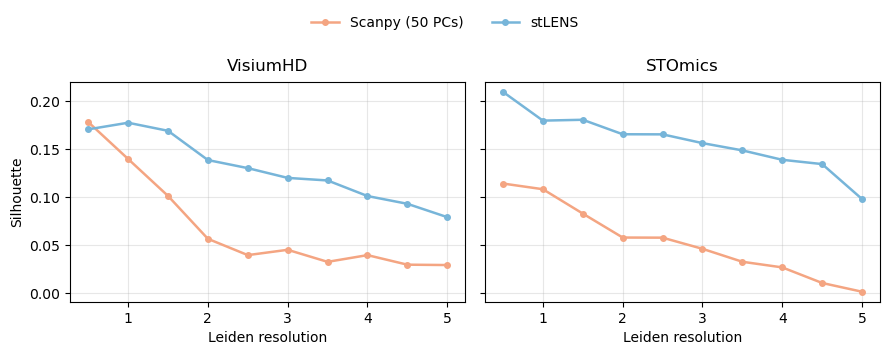

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

METRICS = ['silhouette']
DATASET_METRICS = [('VisiumHD', visium_metrics), ('STOmics', stomics_metrics)]
METHOD_COLORS = {'stLENS': '#77b5d9', 'Scanpy (50 PCs)': '#f4a582'}

fig, axes = plt.subplots(
    1, len(DATASET_METRICS),
    figsize=(4.5 * len(DATASET_METRICS), 3.4),
    sharey=True,                                         
    squeeze=False,
)

for j, (ds_name, df) in enumerate(DATASET_METRICS):
    ax = axes[0, j]
    for metric in METRICS:
        for method, sub in df.groupby('method'):
            ax.plot(
                sub['resolution'], sub[metric],
                marker='o',
                markersize=4,
                linewidth=1.8,
                label=method,
                color=METHOD_COLORS.get(method),
            )
    ax.set_title(ds_name, fontsize=12, pad=8)
    ax.set_xlabel('Leiden resolution')
    ax.set_ylabel('Silhouette' if j == 0 else '')
    ax.grid(alpha=0.3)
    ax.yaxis.set_major_locator(MaxNLocator(nbins=5))
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(0.8)

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.05),
    ncol=len(labels),
    frameon=False,
    fontsize=10,
)

fig.tight_layout(rect=[0, 0, 1, 0.93])
fig.savefig(
    '/bce/groups/pnucolab/analysis/stLENS/dataset/paper/silhouette/revision_silhouette2.pdf',
    bbox_inches='tight'
)
plt.show()
